Please run those two cells before running the Notebook!

As those plotting settings are standard throughout the book, we do not show them in the book every time we plot something.

In [1]:
%matplotlib inline
%config InlineBackend.figure_format = "retina"
!pip install Nasdaq-Data-Link

In [2]:
import matplotlib.pyplot as plt
import seaborn as sns

import warnings
from pandas.errors import SettingWithCopyWarning
warnings.simplefilter(action="ignore", category=FutureWarning)
warnings.simplefilter(action="ignore", category=SettingWithCopyWarning)

# feel free to modify, for example, change the context to "notebook"
sns.set_theme(context="talk", style="whitegrid", 
              palette="colorblind", color_codes=True, 
              rc={"figure.figsize": [12, 8]})

# Chapter 6 - Time Series Analysis and Forecasting

## 6.1 Time series decomposition

### How to do it...

1. Import the libraries and authenticate:

In [3]:
import pandas as pd
import nasdaqdatalink
import seaborn as sns
from statsmodels.tsa.seasonal import seasonal_decompose

nasdaqdatalink.ApiConfig.api_key = "iHtYcvaAGXaJw7yAgwBJ"

2. Download the monthly US unemployment rate from years 2010-2019:

In [4]:
df = (
    nasdaqdatalink.get(dataset="FRED/UNRATENSA", 
                       start_date="2010-01-01", 
                       end_date="2019-12-31")
    .rename(columns={"Value": "unemp_rate"})
)
df.head()

,unemp_rate
Date,
2010-01-01,10.6
2010-02-01,10.4
2010-03-01,10.2
2010-04-01,9.5
2010-05-01,9.3


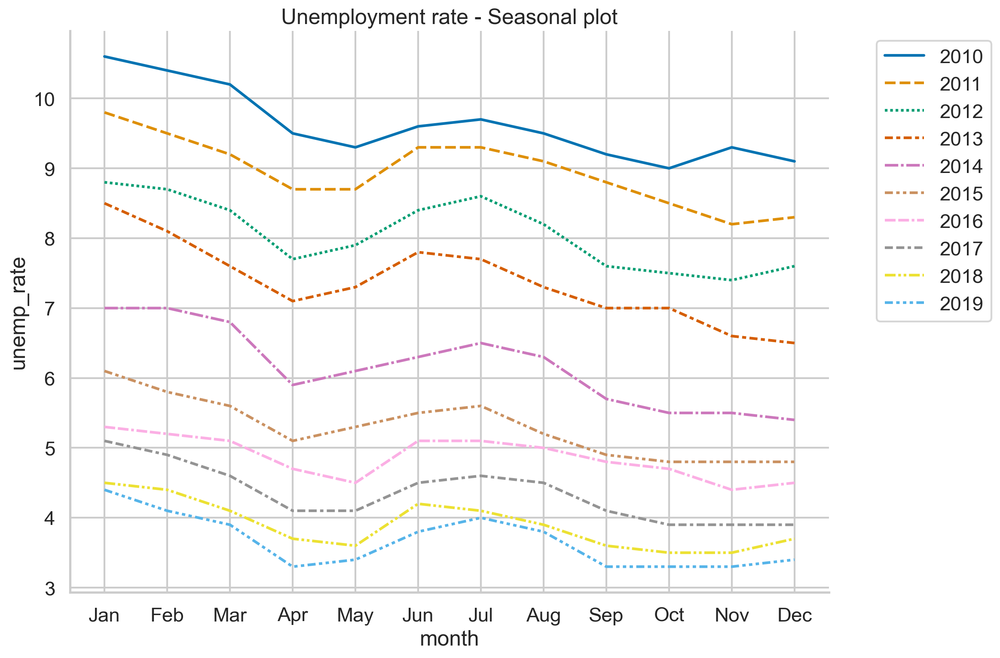

In [5]:
# a quick look at the plot
temp_df = df.copy()

temp_df["year"] = temp_df.index.year
temp_df["month"] = temp_df.index.strftime("%b")

sns.lineplot(data=temp_df, 
             x="month", 
             y="unemp_rate", 
             hue="year",
             style="year", 
             legend="full",
             palette="colorblind")

plt.title("Unemployment rate - Seasonal plot")
plt.legend(bbox_to_anchor=(1.05, 1), loc=2);

sns.despine()
plt.tight_layout()
# plt.savefig("images/figure_6_2", dpi=200)

3. Add rolling mean and standard deviation:

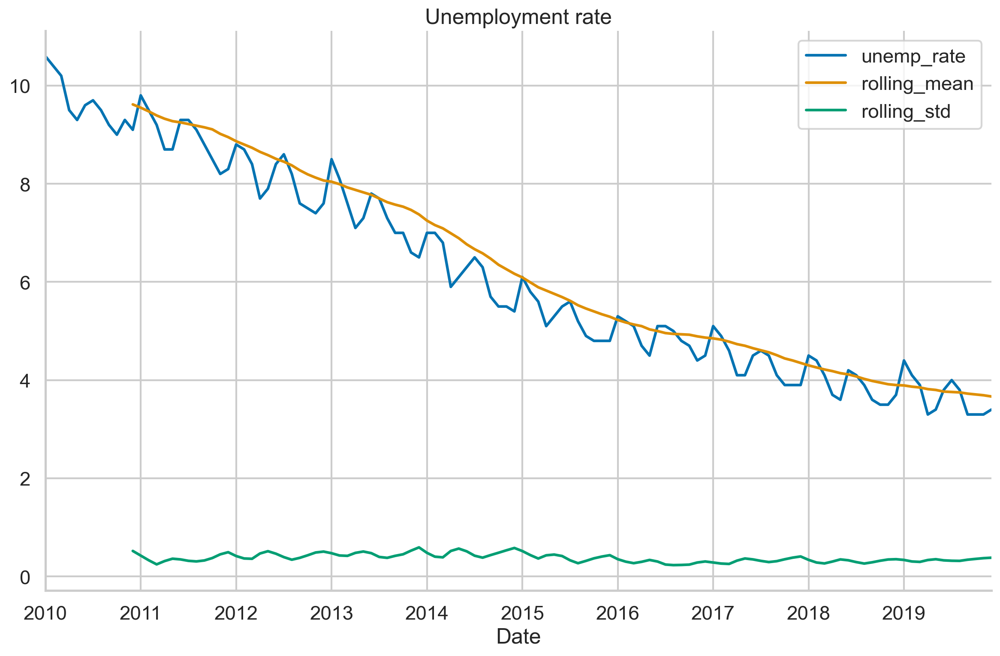

In [6]:
WINDOW_SIZE = 12
df["rolling_mean"] = df["unemp_rate"].rolling(window=WINDOW_SIZE).mean()
df["rolling_std"] = df["unemp_rate"].rolling(window=WINDOW_SIZE).std()
df.plot(title="Unemployment rate")

sns.despine()
plt.tight_layout()
# plt.savefig("images/figure_6_3", dpi=200)

4. Carry out seasonal decomposition using the additive model:

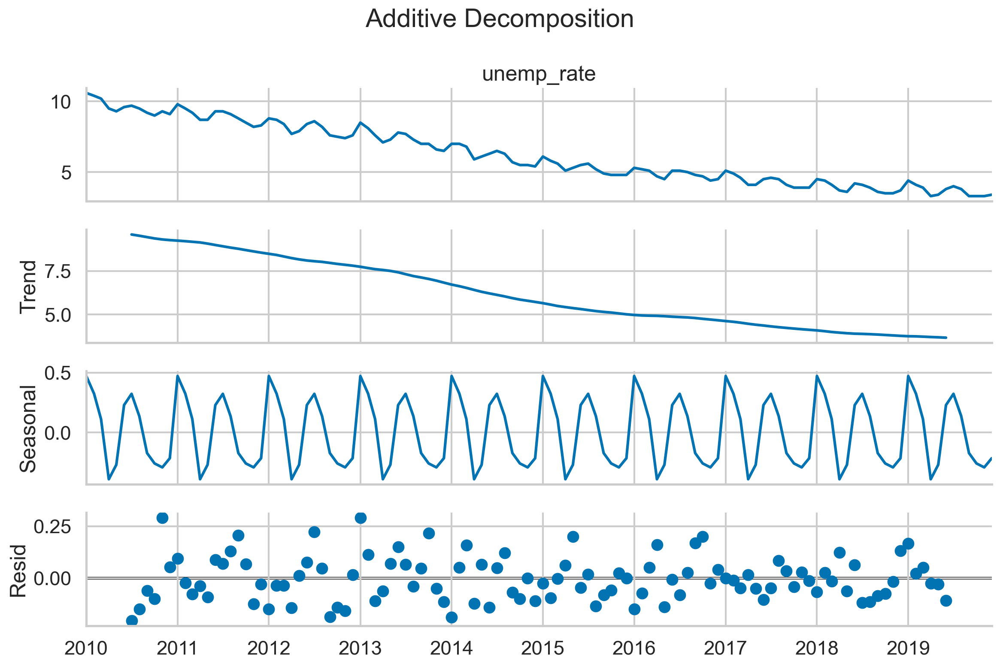

In [7]:
decomposition_results = seasonal_decompose(df["unemp_rate"], 
                                           model="additive")
(
    decomposition_results
    .plot()
    .suptitle("Additive Decomposition")
)

sns.despine()
plt.tight_layout()
# plt.savefig("images/figure_6_4", dpi=200)

### There's more

Use the STL decomposition:

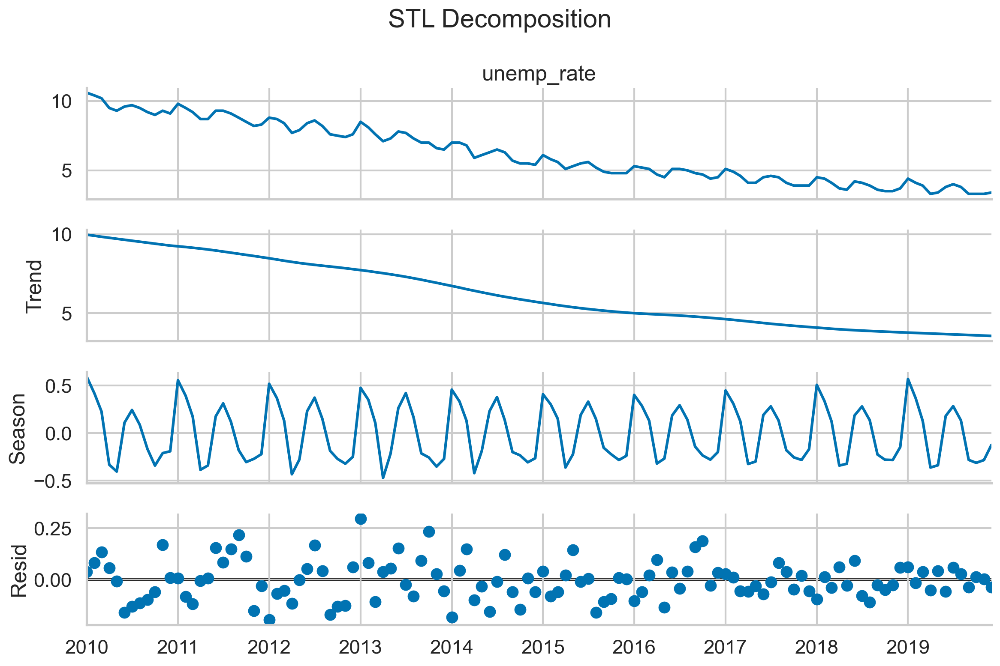

In [8]:
from statsmodels.tsa.seasonal import STL

stl_decomposition = STL(df["unemp_rate"]).fit()
stl_decomposition.plot() \
                 .suptitle("STL Decomposition")

sns.despine()
plt.tight_layout()
# plt.savefig("images/figure_6_5", dpi=200)

Compare the decompositions with and without the robust setting:

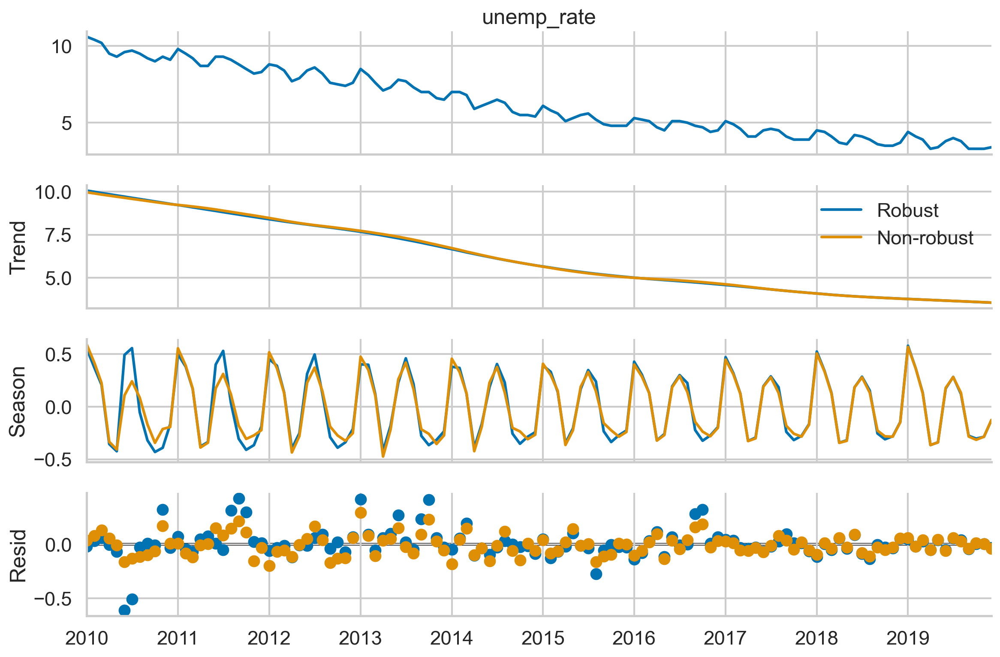

In [9]:
def add_second_stl_to_plot(fig, fitted_stl, labels):
    """
    A helper function adding the 3 components from the second STL fit to the 
    first STL plot
    """
    axs = fig.get_axes()
    comps = ["trend", "seasonal", "resid"]
    for ax, comp in zip(axs[1:], comps):
        series = getattr(fitted_stl, comp)
        if comp == "resid":
            ax.plot(series, marker="o", linestyle="none")
        else:
            ax.plot(series)
            if comp == "trend":
                ax.legend(labels, frameon=False)


stl_robust = STL(df["unemp_rate"], robust=True).fit()
stl_non_robust = STL(df["unemp_rate"], robust=False).fit()
fig = stl_robust.plot()
add_second_stl_to_plot(fig, stl_non_robust, ["Robust", "Non-robust"])

sns.despine()
plt.tight_layout()
# plt.savefig("images/figure_6_6", dpi=200)


Apply the Hodrick-Prescott filter to the unemployment time series:

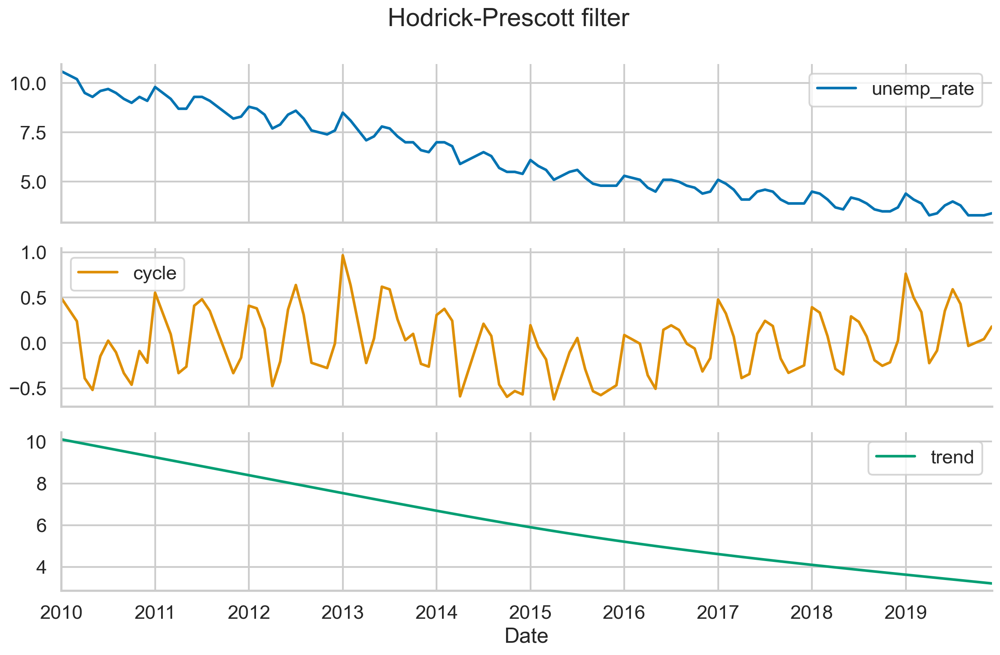

In [10]:
from statsmodels.tsa.filters.hp_filter import hpfilter

hp_df = df[["unemp_rate"]].copy()
hp_df["cycle"], hp_df["trend"] = hpfilter(hp_df["unemp_rate"], 129600)
hp_df.plot(subplots=True, title="Hodrick-Prescott filter")

sns.despine()
plt.tight_layout()

## 6.2 Testing for stationarity in time series

### How to do it...

1. Import the libraries:

In [11]:
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.stattools import adfuller, kpss

2. Define a function for running the ADF test:

In [12]:
def adf_test(x):
    """
    Function for performing the Augmented Dickey-Fuller test for stationarity
    
    Null Hypothesis: time series is not stationary
    Alternate Hypothesis: time series is stationary

    Parameters
    ----------
    x : pd.Series / np.array
        The time series to be checked for stationarity
    
    Returns
    -------
    results: pd.DataFrame
        A DataFrame with the ADF test's results
    """
    
    indices = ["Test Statistic", "p-value",
               "# of Lags Used", "# of Observations Used"]
    
    adf_test = adfuller(x, autolag="AIC")
    results = pd.Series(adf_test[0:4], index=indices)
    
    for key, value in adf_test[4].items():
        results[f"Critical Value ({key})"] = value

    return results


In [13]:
adf_test(df["unemp_rate"])

Test Statistic             -2.053411
p-value                     0.263656
# of Lags Used             12.000000
# of Observations Used    107.000000
Critical Value (1%)        -3.492996
Critical Value (5%)        -2.888955
Critical Value (10%)       -2.581393
dtype: float64

3. Define a function for running the KPSS test:

In [14]:
def kpss_test(x, h0_type="c"):
    """
    Function for performing the Kwiatkowski-Phillips-Schmidt-Shin test for stationarity

    Null Hypothesis: time series is stationary
    Alternate Hypothesis: time series is not stationary

    Parameters
    ----------
    x: pd.Series / np.array
        The time series to be checked for stationarity
    h0_type: str{"c", "ct"}
        Indicates the null hypothesis of the KPSS test:
            * "c": The data is stationary around a constant(default)
            * "ct": The data is stationary around a trend
    
    Returns
    -------
    results: pd.DataFrame
        A DataFrame with the KPSS test's results
    """
    
    indices = ["Test Statistic", "p-value", "# of Lags"]

    kpss_test = kpss(x, regression=h0_type)
    results = pd.Series(kpss_test[0:3], index=indices)
    
    for key, value in kpss_test[3].items():
        results[f"Critical Value ({key})"] = value

    return results

In [15]:
kpss_test(df["unemp_rate"])

C:\Users\Kairav\AppData\Local\Temp\ipykernel_7964\1983588207.py:25: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  kpss_test = kpss(x, regression=h0_type)


Test Statistic           1.799224
p-value                  0.010000
# of Lags                6.000000
Critical Value (10%)     0.347000
Critical Value (5%)      0.463000
Critical Value (2.5%)    0.574000
Critical Value (1%)      0.739000
dtype: float64

4. Generate the ACF/PACF plots:

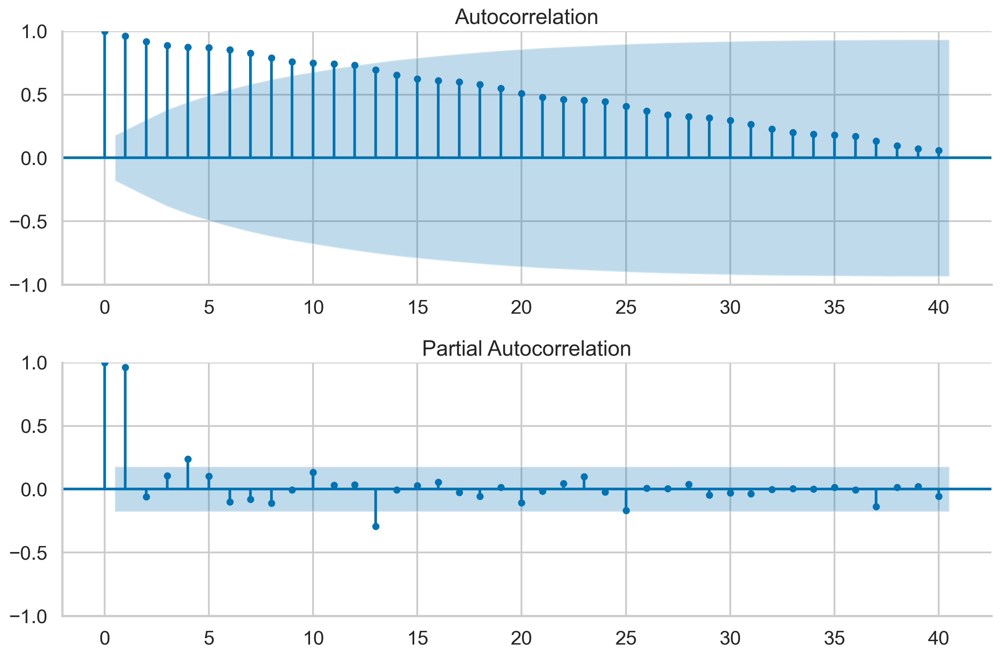

In [16]:
N_LAGS = 40
SIGNIFICANCE_LEVEL = 0.05

fig, ax = plt.subplots(2, 1)
plot_acf(df["unemp_rate"], ax=ax[0], lags=N_LAGS, 
         alpha=SIGNIFICANCE_LEVEL)
plot_pacf(df["unemp_rate"], ax=ax[1], lags=N_LAGS, 
          alpha=SIGNIFICANCE_LEVEL)

sns.despine()
plt.tight_layout()
# plt.savefig("images/figure_6_7", dpi=200)

### There's more

1. Carry out the ADF test using the `arch` library:

In [17]:
!pip install arch

In [18]:
from arch.unitroot import ADF
adf = ADF(df["unemp_rate"])
print(adf.summary().as_text())

   Augmented Dickey-Fuller Results   
Test Statistic                 -2.053
P-value                         0.264
Lags                               12
-------------------------------------

Trend: Constant
Critical Values: -3.49 (1%), -2.89 (5%), -2.58 (10%)
Null Hypothesis: The process contains a unit root.
Alternative Hypothesis: The process is weakly stationary.


2. Carry out the Zivot-Andrews test using the `arch` library:

In [19]:
from arch.unitroot import ZivotAndrews
za = ZivotAndrews(df["unemp_rate"])
print(za.summary().as_text())

        Zivot-Andrews Results        
Test Statistic                 -2.551
P-value                         0.982
Lags                               12
-------------------------------------

Trend: Constant
Critical Values: -5.28 (1%), -4.81 (5%), -4.57 (10%)
Null Hypothesis: The process contains a unit root with a single structural break.
Alternative Hypothesis: The process is trend and break stationary.


## 6.3 Correcting for stationarity in time series

### How to do it...

1. Import the libraries, authenticate and update the inflation data:

In [20]:
!pip install cpi

In [21]:
import numpy as np
import cpi
from datetime import date
from chapter_6_utils import test_autocorrelation

2. Download the prices of gold for 2000-2010 and resample to monthly values:

In [22]:
df = (
    nasdaqdatalink.get(dataset="WGC/GOLD_MONAVG_USD", 
                       start_date="2000-01-01", 
                       end_date="2010-12-31")
    .rename(columns={"Value": "price"})
    .resample("M")
    .last()
)

df.head()

,price
Date,
2000-01-31,284.31
2000-02-29,299.86
2000-03-31,286.39
2000-04-30,279.69
2000-05-31,275.19


As a confirmation, we can check if the series is stationary -> it is not.

ADF test statistic: 2.41 (p-val: 1.00)
KPSS test statistic: 1.84 (p-val: 0.01)


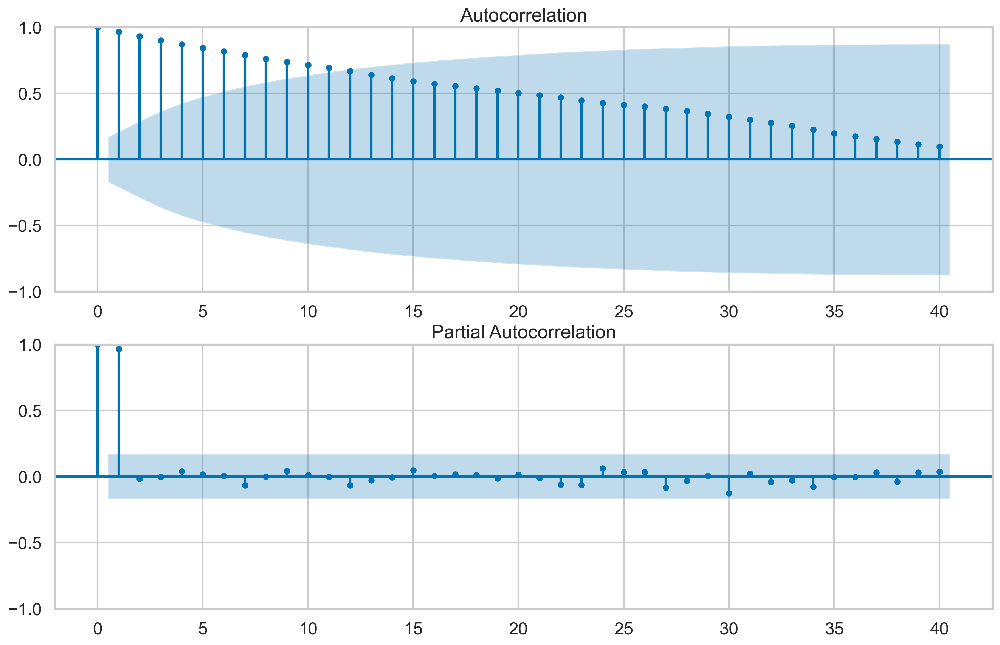

In [23]:
fig = test_autocorrelation(df["price"])

3. Deflate the gold prices (to 2010-12-31 USD values) and plot the results:

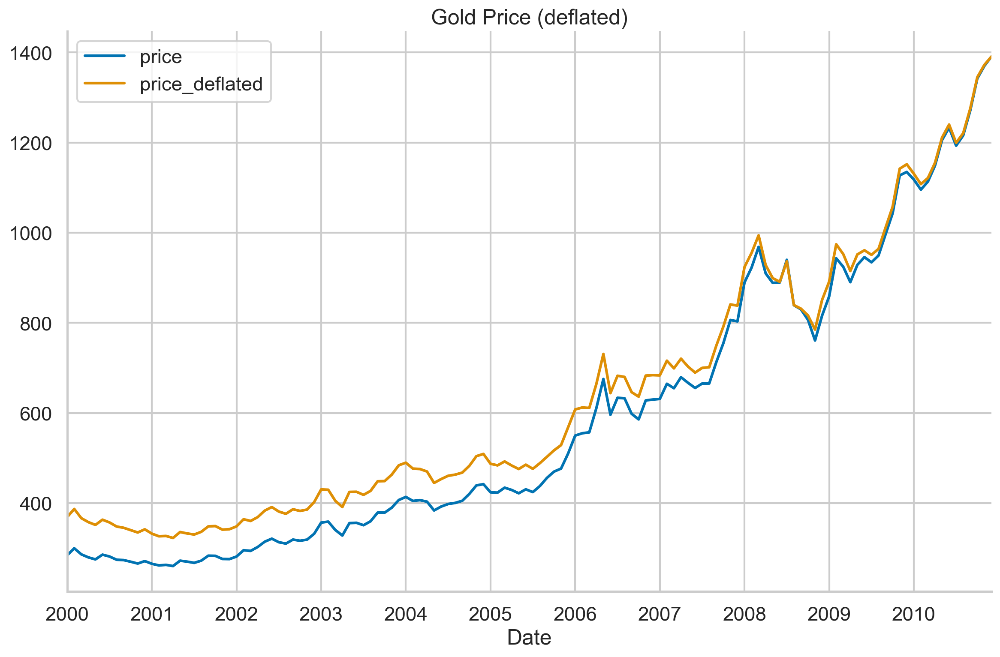

In [24]:
DEFL_DATE = date(2010, 12, 31)

df["dt_index"] = pd.to_datetime(df.index)
df["price_deflated"] = df.apply(
    lambda x: cpi.inflate(x["price"], x["dt_index"], DEFL_DATE), 
    axis=1
)

(
    df.loc[:, ["price", "price_deflated"]]
    .plot(title="Gold Price (deflated)")
)

sns.despine()
plt.tight_layout()
# plt.savefig("images/figure_6_8", dpi=200)

4. Apply the natural logarithm to the deflated series and plot it together with the rolling metrics:

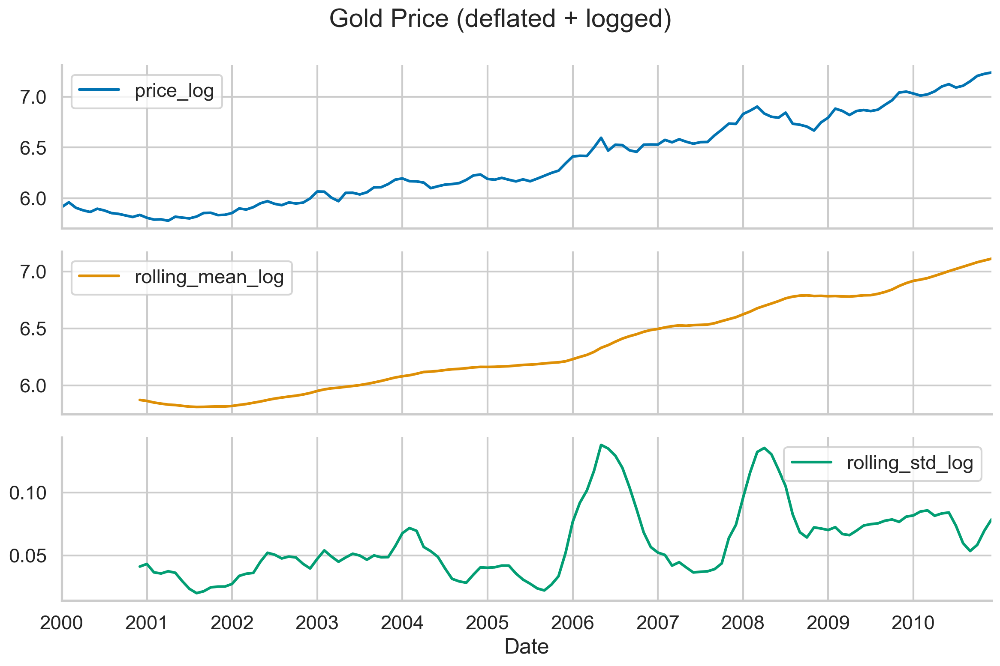

In [25]:
WINDOW = 12
selected_columns = ["price_log", "rolling_mean_log", 
                    "rolling_std_log"]

df["price_log"] = np.log(df.price_deflated)
df["rolling_mean_log"] = df.price_log.rolling(WINDOW) \
                           .mean()
df["rolling_std_log"] = df.price_log.rolling(WINDOW) \
                          .std()

(
    df[selected_columns]
    .plot(title="Gold Price (deflated + logged)", 
          subplots=True)
)

sns.despine()
plt.tight_layout()
# plt.savefig("images/figure_6_9", dpi=200)

5. Use the `test_autocorrelation` (helper function for this chapter) to investigate if the series became stationary:

ADF test statistic: 1.04 (p-val: 0.99)
KPSS test statistic: 1.93 (p-val: 0.01)


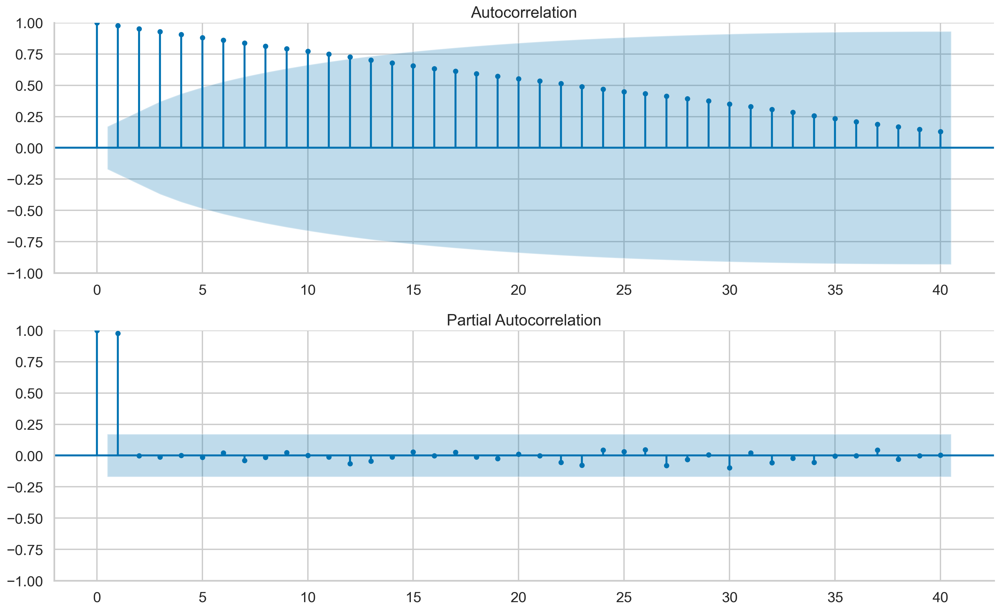

In [26]:
fig = test_autocorrelation(df["price_log"])

sns.despine()
plt.tight_layout()
# plt.savefig("images/figure_6_10", dpi=200)

6. Apply differencing to the series and plot the results:

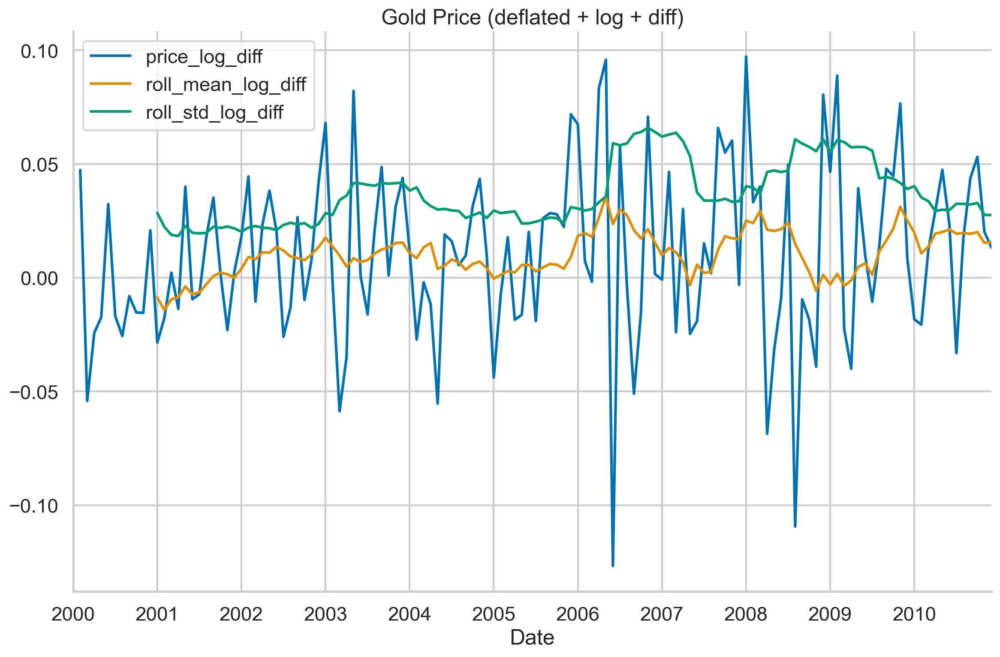

In [27]:
selected_columns = ["price_log_diff", "roll_mean_log_diff", 
                    "roll_std_log_diff"]

df["price_log_diff"] = df.price_log.diff(1)
df["roll_mean_log_diff"] = df.price_log_diff.rolling(WINDOW) \
                             .mean()
df["roll_std_log_diff"] = df.price_log_diff.rolling(WINDOW) \
                            .std()
df[selected_columns].plot(title="Gold Price (deflated + log + diff)")

sns.despine()
plt.tight_layout()
# plt.savefig("images/figure_6_11", dpi=200)

7. Test if the series became stationary:

ADF test statistic: -10.87 (p-val: 0.00)
KPSS test statistic: 0.30 (p-val: 0.10)


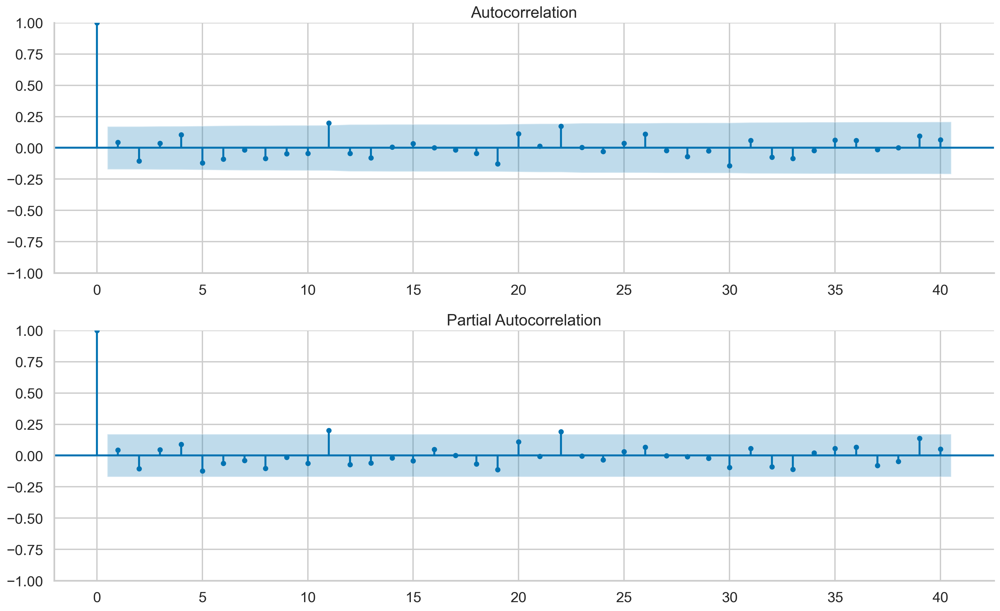

In [28]:
fig = test_autocorrelation(df["price_log_diff"].dropna())

sns.despine()
plt.tight_layout()
# plt.savefig("images/figure_6_12", dpi=200)

### There's more

In [29]:
!pip install pmdarima

In [30]:
from pmdarima.arima import ndiffs, nsdiffs

In [31]:
print(f"Suggested # of differences (ADF): {ndiffs(df['price'], test='adf')}")
print(f"Suggested # of differences (KPSS): {ndiffs(df['price'], test='kpss')}")
print(f"Suggested # of differences (PP): {ndiffs(df['price'], test='pp')}")

Suggested # of differences (ADF): 1
Suggested # of differences (KPSS): 2
Suggested # of differences (PP): 1


In [32]:
print(f"Suggested # of differences (OSCB): {nsdiffs(df['price'], m=12, test='ocsb')}")
print(f"Suggested # of differences (CH): {nsdiffs(df['price'], m=12, test='ch')}")

Suggested # of differences (OSCB): 0
Suggested # of differences (CH): 0


## 6.4 Modeling time series with exponential smoothing methods

### How to do it...

1. Import the libraries:

In [33]:
from datetime import date
from statsmodels.tsa.holtwinters import (ExponentialSmoothing, 
                                         SimpleExpSmoothing, 
                                         Holt)

2. Create the train/test split:

In [34]:
df = (
    nasdaqdatalink.get(dataset="FRED/UNRATENSA", 
                       start_date="2010-01-01", 
                       end_date="2019-12-31")
    .rename(columns={"Value": "unemp_rate"})
)
df.head()

,unemp_rate
Date,
2010-01-01,10.6
2010-02-01,10.4
2010-03-01,10.2
2010-04-01,9.5
2010-05-01,9.3


In [35]:
TEST_LENGTH = 12

df.index.freq = "MS"

df_train = df.iloc[:-TEST_LENGTH]
df_test = df.iloc[-TEST_LENGTH:]

3. Fit 2 Simple Exponential Smoothing models and create forecasts:

In [36]:
ses_1 = SimpleExpSmoothing(df_train).fit(smoothing_level=0.5)
ses_forecast_1 = ses_1.forecast(TEST_LENGTH)

ses_2 = SimpleExpSmoothing(df_train).fit()
ses_forecast_2 = ses_2.forecast(TEST_LENGTH)

ses_1.params_formatted

C:\Users\Kairav\anaconda3\Lib\site-packages\pandas\util\_decorators.py:211: EstimationWarning: Model has no free parameters to estimate. Set optimized=False to suppress this warning
  return func(*args, **kwargs)


,name,param,optimized
smoothing_level,alpha,0.5,False
initial_level,l.0,10.6,False


In [37]:
ses_1.summary()

Dep. Variable:,unemp_rate,No. Observations:,108
Model:,SimpleExpSmoothing,SSE,15.110
Optimized:,False,AIC,-208.414
Trend:,None,BIC,-203.050
Seasonal:,None,AICC,-208.025
Seasonal Periods:,None,Date:,"Fri, 02 Feb 2024"
Box-Cox:,False,Time:,09:33:31
Box-Cox Coeff.:,None,,
,coeff,code,optimized
smoothing_level,0.5000000,alpha,False
initial_level,10.600000,l.0,False


4. Combine the forecasts with the fitted values and plot them:

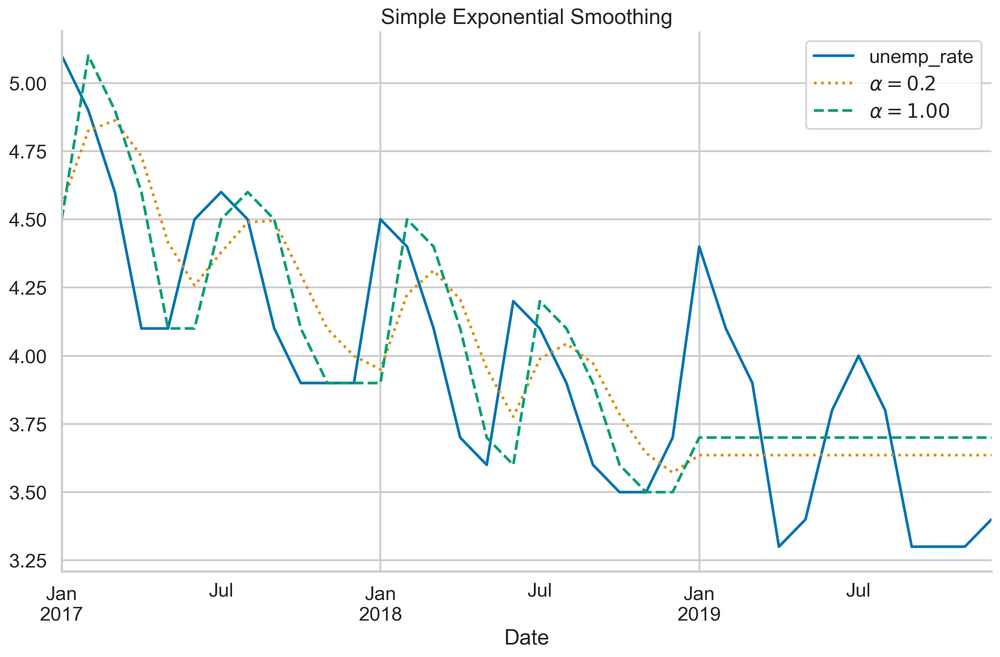

In [38]:
ses_df = df.copy()
ses_df["ses_1"] = ses_1.fittedvalues.append(ses_forecast_1)
ses_df["ses_2"] = ses_2.fittedvalues.append(ses_forecast_2)

opt_alpha = ses_2.model.params["smoothing_level"]

fig, ax = plt.subplots()
ses_df["2017":].plot(style=["-",":","--"], ax=ax,
                     title="Simple Exponential Smoothing")
labels = [
    "unemp_rate", 
    r"$\alpha=0.2$",
    r"$\alpha={0:.2f}$".format(opt_alpha), 
]
ax.legend(labels)

sns.despine()
plt.tight_layout()
# plt.savefig("images/figure_6_13", dpi=200)

5. Fit 3 variants of Holt's linear trend models and create forecasts:

In [39]:
# Holt's model with linear trend
hs_1 = Holt(df_train).fit()
hs_forecast_1 = hs_1.forecast(TEST_LENGTH)

# Holt's model with exponential trend
hs_2 = Holt(df_train, exponential=True).fit()
# equivalent to ExponentialSmoothing(df_train, trend="mul").fit()
hs_forecast_2 = hs_2.forecast(TEST_LENGTH)

# Holt's model with exponential trend and damping
hs_3 = Holt(df_train, exponential=False, 
            damped_trend=True).fit()
hs_forecast_3 = hs_3.forecast(TEST_LENGTH)

In [40]:
hs_3.params_formatted

,name,param,optimized
smoothing_level,alpha,1.000000e+00,True
smoothing_trend,beta,5.601198e-14,True
initial_level,l.0,1.060000e+01,False
initial_trend,b.0,-1.948133e-01,False
damping_trend,phi,9.740666e-01,True


6. Plot the original series together with the models' forecasts:

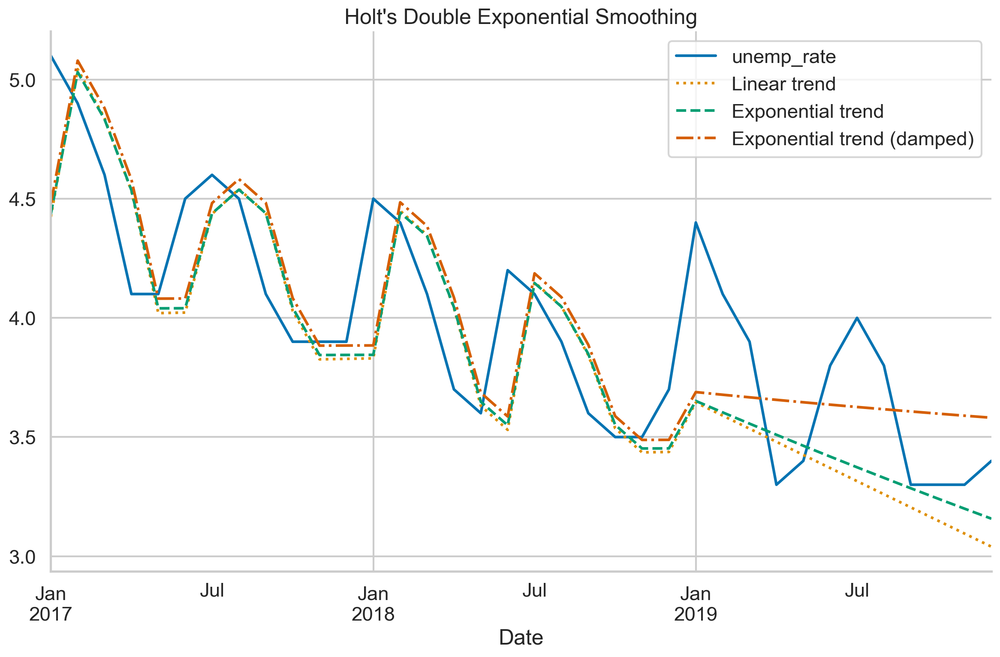

In [41]:
hs_df = df.copy()
hs_df["hs_1"] = hs_1.fittedvalues.append(hs_forecast_1)
hs_df["hs_2"] = hs_2.fittedvalues.append(hs_forecast_2)
hs_df["hs_3"] = hs_3.fittedvalues.append(hs_forecast_3)

fig, ax = plt.subplots()
hs_df["2017":].plot(style=["-",":","--", "-."], ax=ax,
                    title="Holt's Double Exponential Smoothing")
labels = [
    "unemp_rate", 
    "Linear trend",
    "Exponential trend",
    "Exponential trend (damped)",
]
ax.legend(labels)

sns.despine()
plt.tight_layout()
# plt.savefig("images/figure_6_14", dpi=200)

7. Fit 2 variants of Holt-Winter's Triple Exponential Smoothing models and create forecasts:

In [42]:
SEASONAL_PERIODS = 12

# Holt-Winters' model with exponential trend
hw_1 = ExponentialSmoothing(df_train, 
                            trend="mul", 
                            seasonal="add", 
                            seasonal_periods=SEASONAL_PERIODS).fit()
hw_forecast_1 = hw_1.forecast(TEST_LENGTH)

# Holt-Winters' model with exponential trend and damping
hw_2 = ExponentialSmoothing(df_train, 
                            trend="mul", 
                            seasonal="add", 
                            seasonal_periods=SEASONAL_PERIODS, 
                            damped_trend=True).fit()
hw_forecast_2 = hw_2.forecast(TEST_LENGTH)

In [43]:
hw_2.params_formatted

,name,param,optimized
smoothing_level,alpha,6.329139e-01,True
smoothing_trend,beta,1.320513e-16,True
smoothing_seasonal,gamma,1.538616e-16,True
initial_level,l.0,8.211109e+00,True
initial_trend,b.0,1.009634e+00,True
damping_trend,phi,9.727918e-01,True
initial_seasons.0,s.0,2.528936e+00,True
initial_seasons.1,s.1,2.399943e+00,True
initial_seasons.2,s.2,2.192992e+00,True
initial_seasons.3,s.3,1.685716e+00,True


8. Plot the original series together with the models' results:

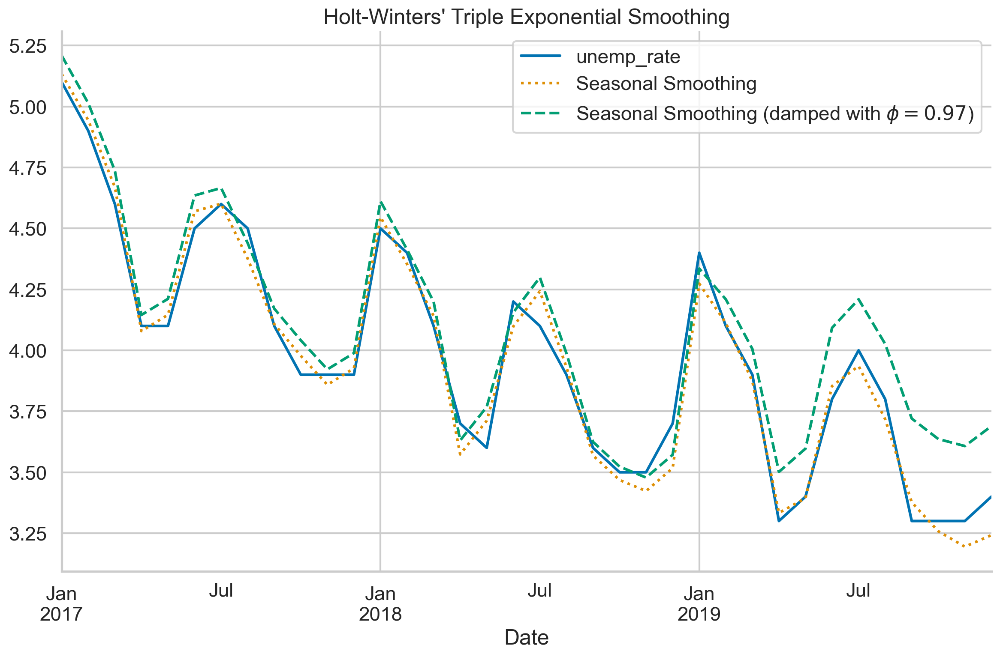

In [44]:
hw_df = df.copy()
hw_df["hw_1"] = hw_1.fittedvalues.append(hw_forecast_1)
hw_df["hw_2"] = hw_2.fittedvalues.append(hw_forecast_2)

fig, ax = plt.subplots()
hw_df["2017":].plot(
    style=["-",":","--"], ax=ax,
    title="Holt-Winters' Triple Exponential Smoothing"
)
phi = hw_2.model.params["damping_trend"]

labels = [
    "unemp_rate", 
    "Seasonal Smoothing",
    f"Seasonal Smoothing (damped with $\phi={phi:.2f}$)"
]
ax.legend(labels)

sns.despine()
plt.tight_layout()
# plt.savefig("images/figure_6_15", dpi=200)

### There's more

1. Import the libraries:

In [45]:
!pip install sktime

In [46]:
from sktime.forecasting.ets import AutoETS
from sklearn.metrics import mean_absolute_percentage_error

2. Fit the `AutoETS` model:

In [47]:
auto_ets = AutoETS(auto=True, n_jobs=-1, sp=12)
auto_ets.fit(df_train.to_period())
auto_ets_fcst = auto_ets.predict(fh=list(range(1, 13)))


In [48]:
auto_ets.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                 ETS Results                                  
==============================================================================
Dep. Variable:                      y   No. Observations:                  108
Model:                      ETS(MAdA)   Log Likelihood                  67.065
Date:                Fri, 02 Feb 2024   AIC                            -96.130
Time:                        09:33:49   BIC                            -45.169
Sample:                    01-31-2010   HQIC                           -75.467
                         - 12-31-2018   Scale                            0.000
Covariance Type:               approx                                         
=======================================================================================
                          coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------------
smoothing_level         0.6208      0.094      6.611      0.000       0.437       0.805
smoothing_trend         0.0204        nan        nan        nan         nan         nan
smoothing_seasonal   3.792e-05        nan        nan        nan         nan         nan
damping_trend           0.9800        nan        nan        nan         nan         nan
initial_level          10.7176        nan        nan        nan         nan         nan
initial_trend          -0.1119      0.043     -2.577      0.010      -0.197      -0.027
initial_seasonal.0     -0.6403        nan        nan        nan         nan         nan
initial_seasonal.1     -0.7357        nan        nan        nan         nan         nan
initial_seasonal.2     -0.7085        nan        nan        nan         nan         nan
initial_seasonal.3     -0.6170        nan        nan        nan         nan         nan
initial_seasonal.4     -0.3149        nan        nan        nan         nan         nan
initial_seasonal.5     -0.1465        nan        nan        nan         nan         nan
initial_seasonal.6     -0.2301        nan        nan        nan         nan         nan
initial_seasonal.7     -0.7316        nan        nan        nan         nan         nan
initial_seasonal.8     -0.7838        nan        nan        nan         nan         nan
initial_seasonal.9     -0.3214        nan        nan        nan         nan         nan
initial_seasonal.10    -0.1175        nan        nan        nan         nan         nan
initial_seasonal.11          0        nan        nan        nan         nan         nan
===================================================================================
Ljung-Box (Q):                       28.47   Jarque-Bera (JB):                 0.18
Prob(Q):                              0.13   Prob(JB):                         0.92
Heteroskedasticity (H):               1.69   Skew:                            -0.04
Prob(H) (two-sided):                  0.12   Kurtosis:                         2.82
===================================================================================

Warnings:
[1] Covariance matrix calculated using numerical (complex-step) differentiation.
"""

3. Add the model's forecast to the plot of the Holt-Winters' forecasts:

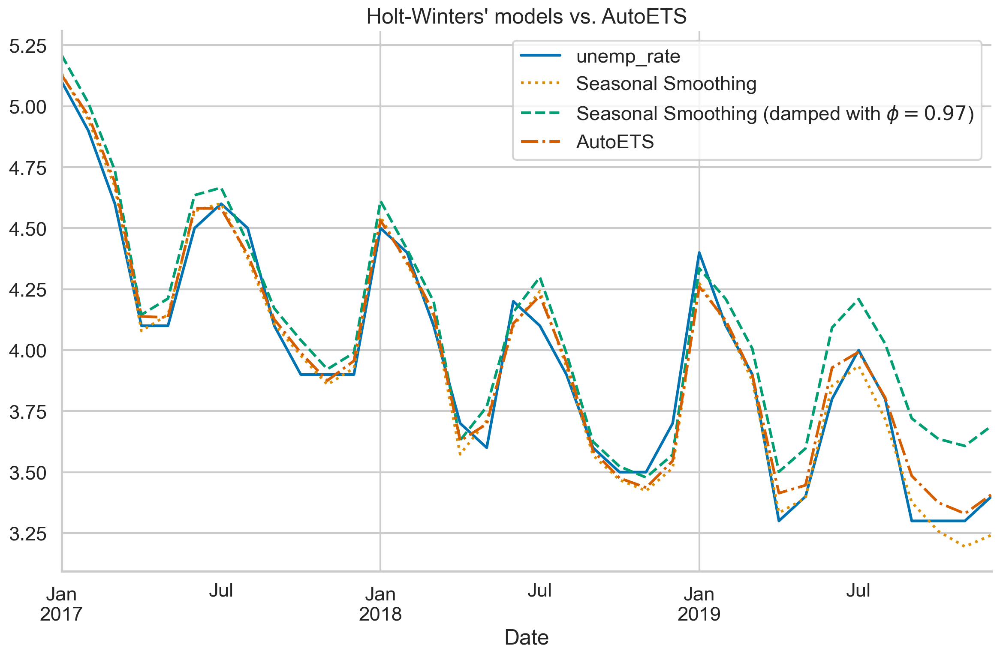

In [49]:
auto_ets_df = hw_df.to_period().copy()
auto_ets_df["auto_ets"] = (
    auto_ets
    ._fitted_forecaster
    .fittedvalues
    .append(auto_ets_fcst["unemp_rate"])
)

fig, ax = plt.subplots()
auto_ets_df["2017":].plot(
    style=["-",":","--","-."], ax=ax,
    title="Holt-Winters' models vs. AutoETS"
)
labels = [
    "unemp_rate", 
    "Seasonal Smoothing",
    f"Seasonal Smoothing (damped with $\phi={phi:.2f}$)",
    "AutoETS",
]
ax.legend(labels)

sns.despine()
plt.tight_layout()
# plt.savefig("images/figure_6_16", dpi=200)

4. Calculate the MAPEs of the Holt-Winters' forecasts and the ones from AutoETS:

In [50]:
fcst_dict = {
    "Seasonal Smoothing": hw_forecast_1,
    "Seasonal Smoothing (damped)": hw_forecast_2,
    "AutoETS": auto_ets_fcst,
}

print("MAPEs ----")
for key, value in fcst_dict.items():
    mape = mean_absolute_percentage_error(df_test, value)
    print(f"{key}: {100 * mape:.2f}%")

MAPEs ----
Seasonal Smoothing: 1.81%
Seasonal Smoothing (damped): 6.53%
AutoETS: 1.78%


## 6.5 Modeling time series with ARIMA class models

### How to do it...

1. Import the libraries:

In [51]:
from statsmodels.tsa.arima.model import ARIMA
from chapter_6_utils import test_autocorrelation
from sklearn.metrics import mean_absolute_percentage_error

2. Create the train/test split:

In [52]:
TEST_LENGTH = 12
df_train = df.iloc[:-TEST_LENGTH]
df_test = df.iloc[-TEST_LENGTH:]

3. Apply the log transformation and calculate the first differences:

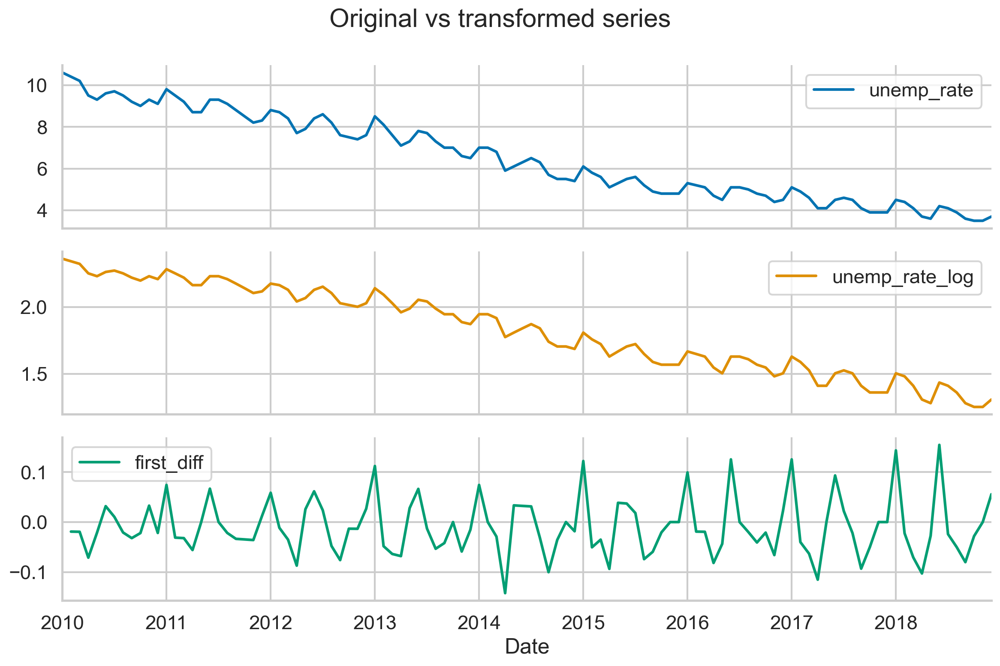

In [53]:
df_train["unemp_rate_log"] = np.log(df_train["unemp_rate"])
df_train["first_diff"] = df_train["unemp_rate_log"].diff()

df_train.plot(subplots=True, 
              title="Original vs transformed series")

sns.despine()
plt.tight_layout()
# plt.savefig("images/figure_6_17", dpi=200)

4. Test the stationarity of the differenced series:

ADF test statistic: -2.97 (p-val: 0.04)
KPSS test statistic: 0.04 (p-val: 0.10)


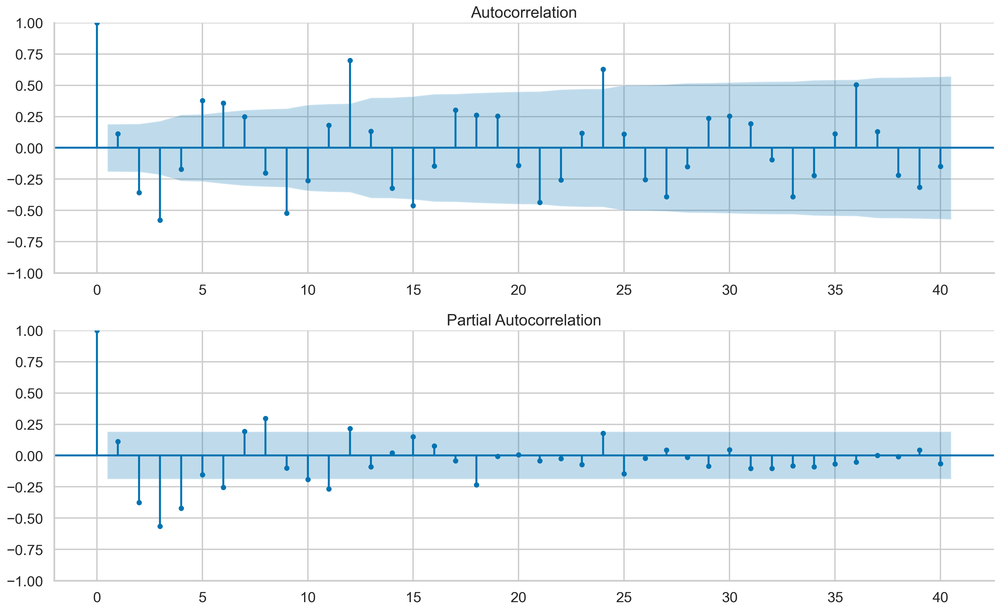

In [54]:
fig = test_autocorrelation(df_train["first_diff"].dropna())

sns.despine()
plt.tight_layout()
# plt.savefig("images/figure_6_18", dpi=200)

5. Fit two different ARIMA models and print their summaries:

In [55]:
arima_111 = ARIMA(
    df_train["unemp_rate_log"], order=(1, 1, 1)
).fit()
arima_111.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:         unemp_rate_log   No. Observations:                  108
Model:                 ARIMA(1, 1, 1)   Log Likelihood                 157.020
Date:                Fri, 02 Feb 2024   AIC                           -308.040
Time:                        09:33:52   BIC                           -300.021
Sample:                    01-01-2010   HQIC                          -304.789
                         - 12-01-2018                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.5541      0.401      1.381      0.167      -0.232       1.340
ma.L1         -0.7314      0.306     -2.392      0.017      -1.331      -0.132
sigma2         0.0031      0.000      6.823      0.000       0.002       0.004
===================================================================================
Ljung-Box (L1) (Q):                   2.55   Jarque-Bera (JB):                 9.59
Prob(Q):                              0.11   Prob(JB):                         0.01
Heteroskedasticity (H):               2.33   Skew:                             0.64
Prob(H) (two-sided):                  0.01   Kurtosis:                         3.71
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

In [56]:
arima_212 = ARIMA(
    df_train["unemp_rate_log"], order=(2, 1, 2)
).fit()
arima_212.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:         unemp_rate_log   No. Observations:                  108
Model:                 ARIMA(2, 1, 2)   Log Likelihood                 196.744
Date:                Fri, 02 Feb 2024   AIC                           -383.488
Time:                        09:33:53   BIC                           -370.124
Sample:                    01-01-2010   HQIC                          -378.070
                         - 12-01-2018                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.9952      0.014     69.636      0.000       0.967       1.023
ar.L2         -0.9894      0.014    -70.051      0.000      -1.017      -0.962
ma.L1         -1.1436     35.818     -0.032      0.975     -71.346      69.059
ma.L2          1.0000     62.644      0.016      0.987    -121.780     123.780
sigma2         0.0014      0.086      0.016      0.987      -0.166       0.169
===================================================================================
Ljung-Box (L1) (Q):                  11.31   Jarque-Bera (JB):                 3.24
Prob(Q):                              0.00   Prob(JB):                         0.20
Heteroskedasticity (H):               1.99   Skew:                             0.40
Prob(H) (two-sided):                  0.04   Kurtosis:                         3.28
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

6. Combine the fitted values with the predictions:

In [57]:
df["pred_111_log"] = (
    arima_111
    .fittedvalues
    .append(arima_111.forecast(TEST_LENGTH))
)
df["pred_111"] = np.exp(df["pred_111_log"])

df["pred_212_log"] = (
    arima_212
    .fittedvalues
    .append(arima_212.forecast(TEST_LENGTH))
)
df["pred_212"] = np.exp(df["pred_212_log"])
df

,unemp_rate,pred_111_log,pred_111,pred_212_log,pred_212
Date,,,,,
2010-01-01,10.6,0.000000,1.000000,0.000000,1.000000
2010-02-01,10.4,2.360854,10.600000,2.360854,10.600000
2010-03-01,10.2,2.344579,10.428879,2.337667,10.357044
2010-04-01,9.5,2.327491,10.252186,2.324155,10.218039
2010-05-01,9.3,2.266963,9.650051,2.256334,9.548022
...,...,...,...,...,...
2019-08-01,3.8,1.308395,3.700231,1.340855,3.822310
2019-09-01,3.3,1.308395,3.700232,1.272416,3.569468
2019-10-01,3.3,1.308396,3.700232,1.222033,3.394082


In [58]:
#  The number of initial periods during which the loglikelihood is not recorded. Default is 0.
arima_111.loglikelihood_burn

1

In [59]:
arima_111.nobs_diffuse

0

7. Plot the forecasts and calculate the MAPEs:

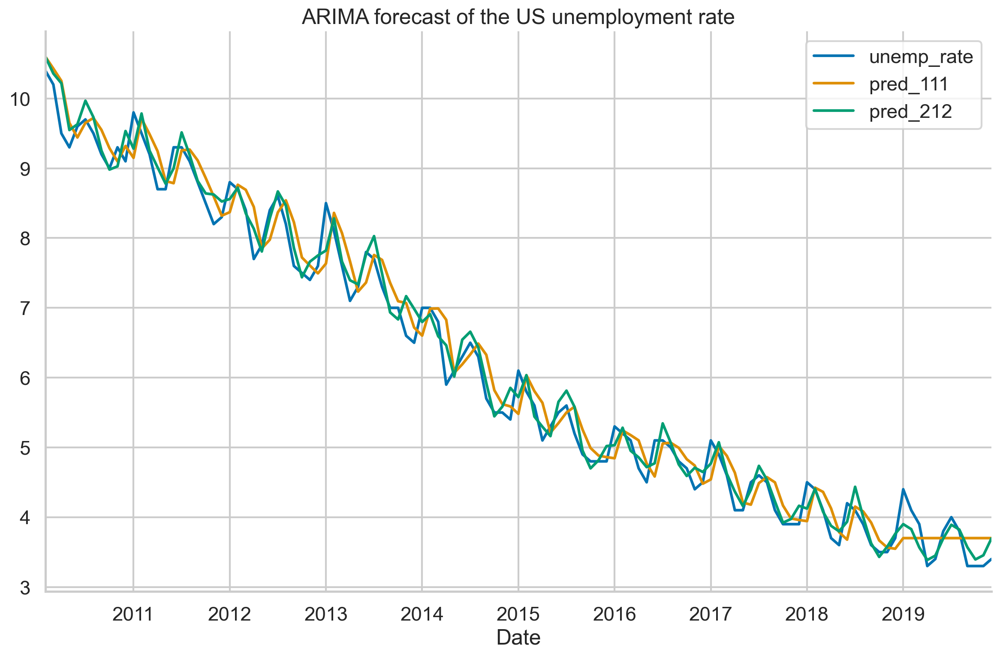

In [60]:
(
    df[["unemp_rate", "pred_111", "pred_212"]]
    .iloc[1:]
    .plot(title="ARIMA forecast of the US unemployment rate")
);

sns.despine()
plt.tight_layout()
# plt.savefig("images/figure_6_21", dpi=200)

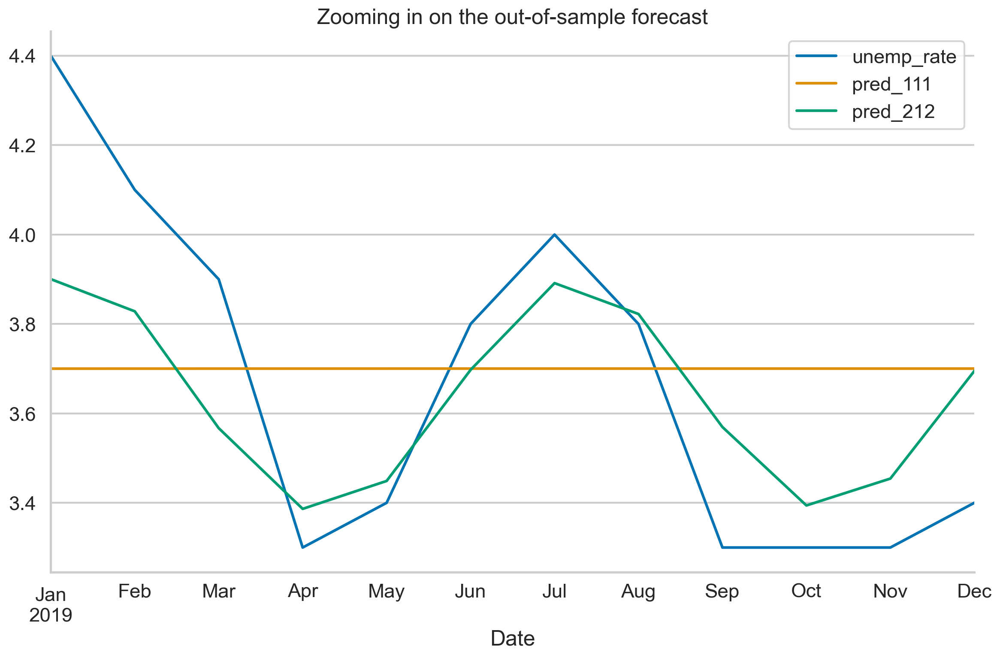

In [61]:
(
    df[["unemp_rate", "pred_111", "pred_212"]]
    .iloc[-TEST_LENGTH:]
    .plot(title="Zooming in on the out-of-sample forecast")
);

sns.despine()
plt.tight_layout()
# plt.savefig("images/figure_6_22", dpi=200)

In [62]:
mape_111 = mean_absolute_percentage_error(
    df["unemp_rate"].iloc[-TEST_LENGTH:], 
    df["pred_111"].iloc[-TEST_LENGTH:]
)

mape_212 = mean_absolute_percentage_error(
    df["unemp_rate"].iloc[-TEST_LENGTH:], 
    df["pred_212"].iloc[-TEST_LENGTH:]
)

print(f"MAPE of ARIMA(1,1,1): {100 * mape_111:.2f}%")
print(f"MAPE of ARIMA(2,1,2): {100 * mape_212:.2f}%")

MAPE of ARIMA(1,1,1): 9.14%
MAPE of ARIMA(2,1,2): 5.08%


8. Extract the forecast with the corresponding confidence intervals and plot them all together:

In [63]:
preds_df = arima_212.get_forecast(TEST_LENGTH).summary_frame()
preds_df.columns = ["fcst", "fcst_se", "ci_lower", "ci_upper"]
plot_df = df_test[["unemp_rate"]].join(np.exp(preds_df))
plot_df.head()

,unemp_rate,fcst,fcst_se,ci_lower,ci_upper
Date,,,,,
2019-01-01,4.4,3.900316,1.038005,3.625349,4.196138
2019-02-01,4.1,3.828314,1.050473,3.476114,4.216198
2019-03-01,3.9,3.566973,1.057630,3.195999,3.981007
2019-04-01,3.3,3.386459,1.063923,2.999180,3.823746
2019-05-01,3.4,3.448904,1.071993,3.009583,3.952355


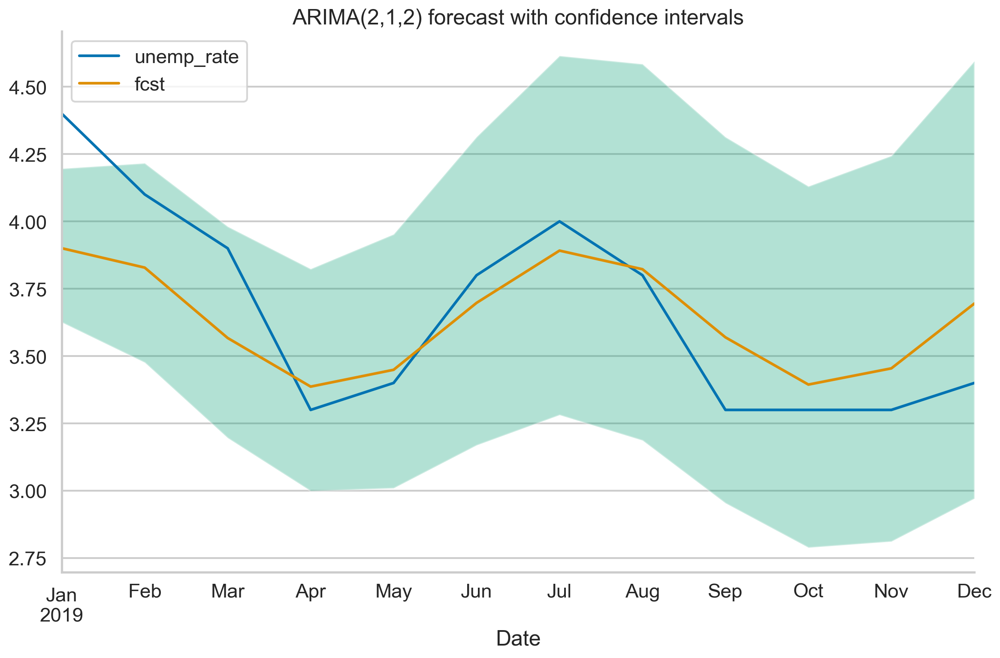

In [64]:
fig, ax = plt.subplots()

(
    plot_df[["unemp_rate", "fcst"]]
    .plot(ax=ax,
          title="ARIMA(2,1,2) forecast with confidence intervals")
)

ax.fill_between(plot_df.index,
                plot_df["ci_lower"],
                plot_df["ci_upper"],
                alpha=0.3, 
                facecolor="g")

ax.legend(loc="upper left");

sns.despine()
plt.tight_layout()
# plt.savefig("images/figure_6_23", dpi=200)

### There's more

1. Plot diagnostic plots for the residuals of the fitted ARIMA(2,1,2) model:

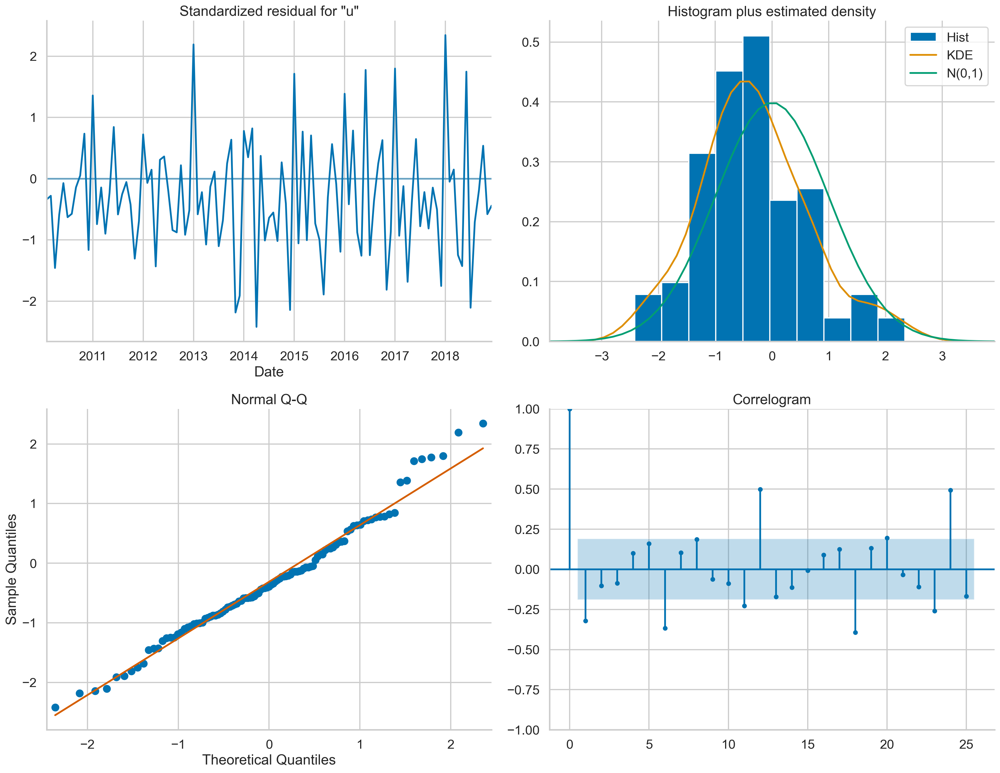

In [65]:
arima_212.plot_diagnostics(figsize=(18, 14), lags=25)

sns.despine()
plt.tight_layout()
# plt.savefig("images/figure_6_24", dpi=200)

2. Apply the Ljung-Box's test for no autocorrelation in the residuals and plot the results:

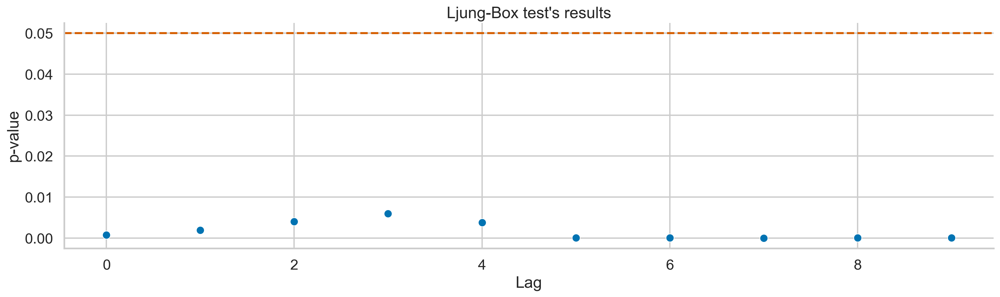

In [66]:
ljung_box_results = arima_212.test_serial_correlation(method="ljungbox")
ljung_box_pvals = ljung_box_results[0][1]

fig, ax = plt.subplots(1, figsize=[16, 5])
sns.scatterplot(x=range(len(ljung_box_pvals)), 
                y=ljung_box_pvals, 
                ax=ax)
ax.axhline(0.05, ls="--", c="r")
ax.set(title="Ljung-Box test's results",
       xlabel="Lag",
       ylabel="p-value")

sns.despine()
plt.tight_layout()
# plt.savefig("images/figure_6_25", dpi=200)

In [67]:
# alternative way to get the same test results
from statsmodels.stats.diagnostic import acorr_ljungbox
ljung_box_results_df = acorr_ljungbox(arima_212.resid[1:])
ljung_box_results_df

,lb_stat,lb_pvalue
1,10.673785,0.001087
2,11.718615,0.002853
3,12.505823,0.005837
4,13.641451,0.008532
5,16.467144,0.005630
6,31.805065,0.000018
7,32.929961,0.000027
8,36.983066,0.000012
9,37.549510,0.000021
10,38.449909,0.000032


The first residual of the fitted ARIMA/ARMA model is equal to the first observation of the time series. For more information, please see the following:
* https://stats.stackexchange.com/questions/202903/start-up-values-for-the-kalman-filter/221723#221723

In [68]:
df_train

,unemp_rate,unemp_rate_log,first_diff
Date,,,
2010-01-01,10.6,2.360854,NaN
2010-02-01,10.4,2.341806,-0.019048
2010-03-01,10.2,2.322388,-0.019418
2010-04-01,9.5,2.251292,-0.071096
2010-05-01,9.3,2.230014,-0.021277
...,...,...,...
2018-08-01,3.9,1.360977,-0.050010
2018-09-01,3.6,1.280934,-0.080043
2018-10-01,3.5,1.252763,-0.028171


In [69]:
arima_212.resid

Date
2010-01-01    2.360854
2010-02-01   -0.019048
2010-03-01   -0.015279
2010-04-01   -0.072863
2010-05-01   -0.026320
                ...   
2018-08-01   -0.026455
2018-09-01   -0.006992
2018-10-01    0.020042
2018-11-01   -0.021590
2018-12-01   -0.016429
Freq: MS, Length: 108, dtype: float64

Other available tests:

In [70]:
arima_212.test_normality(method="jarquebera")

array([[3.24458477, 0.19744556, 0.40374839, 3.27514776]])

In [71]:
arima_212.test_heteroskedasticity(method="breakvar")

array([[1.99121516, 0.04212109]])

## 6.6 Finding the best-fitting ARIMA model with auto-ARIMA

### How to do it...

1. Import the libraries:

In [72]:
import pmdarima as pm
from sklearn.metrics import mean_absolute_percentage_error

2. Create the train/test split:

In [73]:
df = (
    nasdaqdatalink.get(dataset="FRED/UNRATENSA", 
                       start_date="2010-01-01", 
                       end_date="2019-12-31")
    .rename(columns={"Value": "unemp_rate"})
)

# to hide the warnings of `statsmodels`
df.index.freq = "MS"

df.head()

,unemp_rate
Date,
2010-01-01,10.6
2010-02-01,10.4
2010-03-01,10.2
2010-04-01,9.5
2010-05-01,9.3


In [74]:
TEST_LENGTH = 12
df_train = df.iloc[:-TEST_LENGTH]
df_test = df.iloc[-TEST_LENGTH:]

3. Find the best hyperparameters of the ARIMA model using the auto-ARIMA procedure:

In [75]:
auto_arima = pm.auto_arima(df_train,
                           test="adf",
                           seasonal=False,
                           with_intercept=False,
                           stepwise=True,
                           suppress_warnings=True,
                           trace=True)
                            
auto_arima.summary()

Performing stepwise search to minimize aic
 ARIMA(2,1,2)(0,0,0)[0]             : AIC=7.411, Time=0.26 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=77.864, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=77.461, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=75.688, Time=0.03 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=68.551, Time=0.08 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=54.321, Time=0.19 sec
 ARIMA(3,1,2)(0,0,0)[0]             : AIC=7.458, Time=0.29 sec
 ARIMA(2,1,3)(0,0,0)[0]             : AIC=7.155, Time=0.35 sec
 ARIMA(1,1,3)(0,0,0)[0]             : AIC=60.069, Time=0.10 sec
 ARIMA(3,1,3)(0,0,0)[0]             : AIC=10.692, Time=0.42 sec
 ARIMA(2,1,4)(0,0,0)[0]             : AIC=inf, Time=0.36 sec
 ARIMA(1,1,4)(0,0,0)[0]             : AIC=inf, Time=0.28 sec
 ARIMA(3,1,4)(0,0,0)[0]             : AIC=inf, Time=0.34 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=25.922, Time=0.27 sec

Best model:  ARIMA(2,1,3)(0,0,0)[0]          
Total fit time: 3.039 seco

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                      y   No. Observations:                  108
Model:               SARIMAX(2, 1, 3)   Log Likelihood                   2.423
Date:                Fri, 02 Feb 2024   AIC                              7.155
Time:                        09:34:01   BIC                             23.192
Sample:                    01-01-2010   HQIC                            13.656
                         - 12-01-2018                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          1.0040      0.008    132.649      0.000       0.989       1.019
ar.L2         -0.9970      0.004   -238.120      0.000      -1.005      -0.989
ma.L1         -1.2878      0.112    -11.531      0.000      -1.507      -1.069
ma.L2          1.2120      0.164      7.371      0.000       0.890       1.534
ma.L3         -0.2145      0.102     -2.097      0.036      -0.415      -0.014
sigma2         0.0526      0.010      5.389      0.000       0.033       0.072
===================================================================================
Ljung-Box (L1) (Q):                   2.80   Jarque-Bera (JB):                 1.43
Prob(Q):                              0.09   Prob(JB):                         0.49
Heteroskedasticity (H):               0.48   Skew:                             0.27
Prob(H) (two-sided):                  0.03   Kurtosis:                         3.13
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

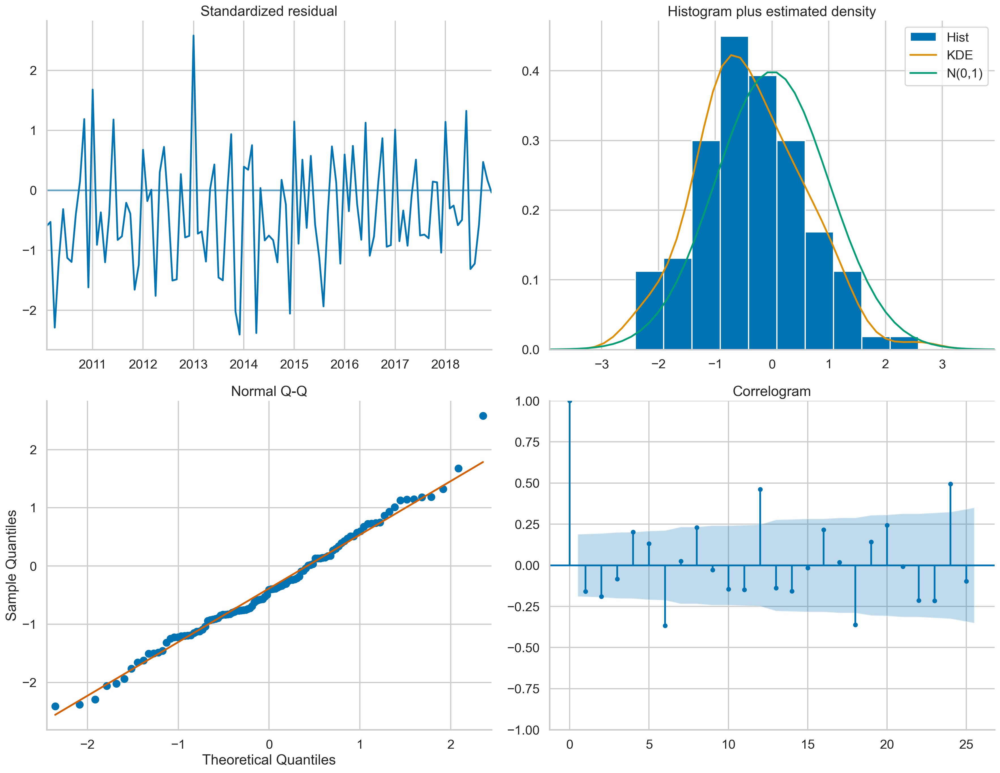

In [76]:
auto_arima.plot_diagnostics(figsize=(18, 14), lags=25)

sns.despine()
plt.tight_layout()
# plt.savefig("images/figure_6_27", dpi=200)

4. Find the best hyperparameters of a SARIMA model using the auto-ARIMA procedure:

In [77]:
auto_sarima = pm.auto_arima(df_train,
                            test="adf",
                            seasonal=True,
                            m=12,
                            with_intercept=False,
                            stepwise=True,
                            suppress_warnings=True,
                            trace=True)
auto_sarima.summary()

Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12]             : AIC=inf, Time=0.55 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=77.864, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12]             : AIC=-19.349, Time=0.07 sec
 ARIMA(0,1,1)(0,0,1)[12]             : AIC=39.115, Time=0.11 sec
 ARIMA(1,1,0)(0,0,0)[12]             : AIC=77.461, Time=0.03 sec
 ARIMA(1,1,0)(2,0,0)[12]             : AIC=inf, Time=0.23 sec
 ARIMA(1,1,0)(1,0,1)[12]             : AIC=inf, Time=0.27 sec
 ARIMA(1,1,0)(0,0,1)[12]             : AIC=39.307, Time=0.11 sec
 ARIMA(1,1,0)(2,0,1)[12]             : AIC=inf, Time=0.79 sec
 ARIMA(0,1,0)(1,0,0)[12]             : AIC=-19.382, Time=0.06 sec
 ARIMA(0,1,0)(2,0,0)[12]             : AIC=inf, Time=0.16 sec
 ARIMA(0,1,0)(1,0,1)[12]             : AIC=inf, Time=0.24 sec
 ARIMA(0,1,0)(0,0,1)[12]             : AIC=37.495, Time=0.06 sec
 ARIMA(0,1,0)(2,0,1)[12]             : AIC=inf, Time=0.68 sec
 ARIMA(0,1,1)(1,0,0)[12]             : AIC=-22.056, Time=0.13 sec


<class 'statsmodels.iolib.summary.Summary'>
"""
                                        SARIMAX Results                                        
===============================================================================================
Dep. Variable:                                       y   No. Observations:                  108
Model:             SARIMAX(1, 1, 5)x(1, 0, [1, 2], 12)   Log Likelihood                  41.590
Date:                                 Fri, 02 Feb 2024   AIC                            -63.179
Time:                                         09:34:52   BIC                            -36.451
Sample:                                     01-01-2010   HQIC                           -52.344
                                          - 12-01-2018                                         
Covariance Type:                                   opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.3526      0.327      1.077      0.281      -0.289       0.994
ma.L1         -0.6232      0.324     -1.926      0.054      -1.257       0.011
ma.L2         -0.0080      0.178     -0.045      0.964      -0.357       0.341
ma.L3         -0.1852      0.156     -1.186      0.236      -0.491       0.121
ma.L4          0.1338      0.159      0.843      0.399      -0.177       0.445
ma.L5          0.2253      0.151      1.494      0.135      -0.070       0.521
ar.S.L12       0.9978      0.014     70.597      0.000       0.970       1.025
ma.S.L12      -0.9988      0.310     -3.225      0.001      -1.606      -0.392
ma.S.L24       0.1142      0.136      0.838      0.402      -0.153       0.381
sigma2         0.0197      0.006      3.253      0.001       0.008       0.032
===================================================================================
Ljung-Box (L1) (Q):                   0.05   Jarque-Bera (JB):                 1.90
Prob(Q):                              0.82   Prob(JB):                         0.39
Heteroskedasticity (H):               0.62   Skew:                            -0.30
Prob(H) (two-sided):                  0.15   Kurtosis:                         3.27
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

Please refer to the following SO question to see why the procedure returns `AIC=inf` for some model specifications:
* https://stats.stackexchange.com/questions/160612/auto-arima-doesnt-calculate-aic-values-for-the-majority-of-models

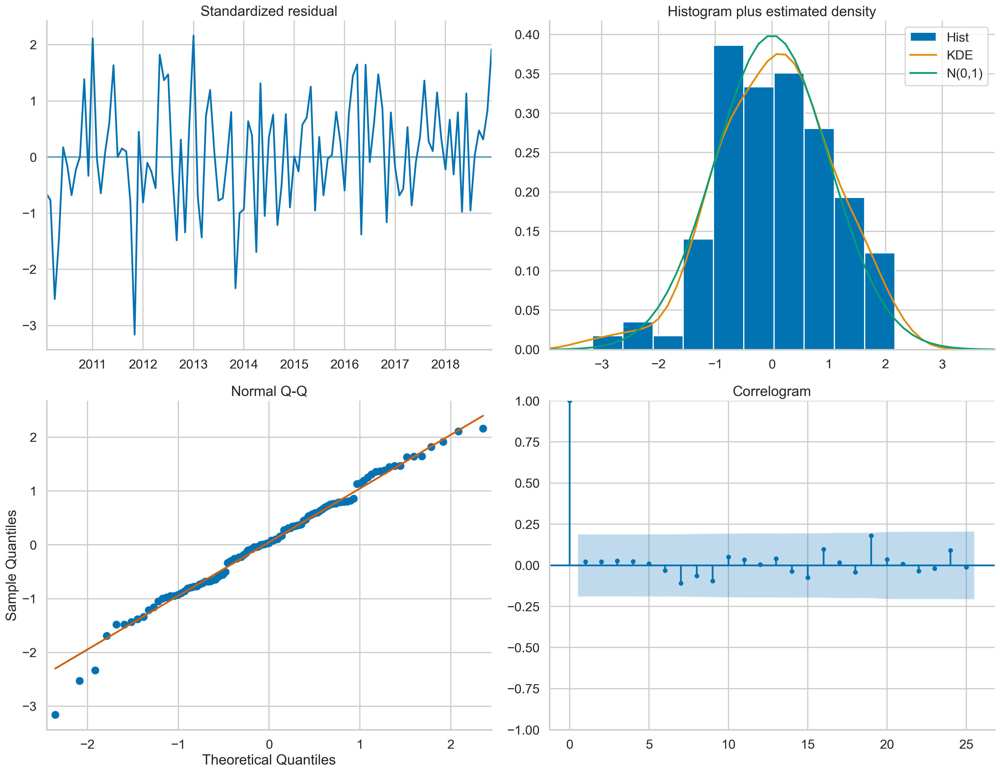

In [78]:
auto_sarima.plot_diagnostics(figsize=(18, 14), lags=25);

sns.despine()
plt.tight_layout()
# plt.savefig("images/figure_6_29", dpi=200)

5. Calculate the forecasts from the two models and plot them:

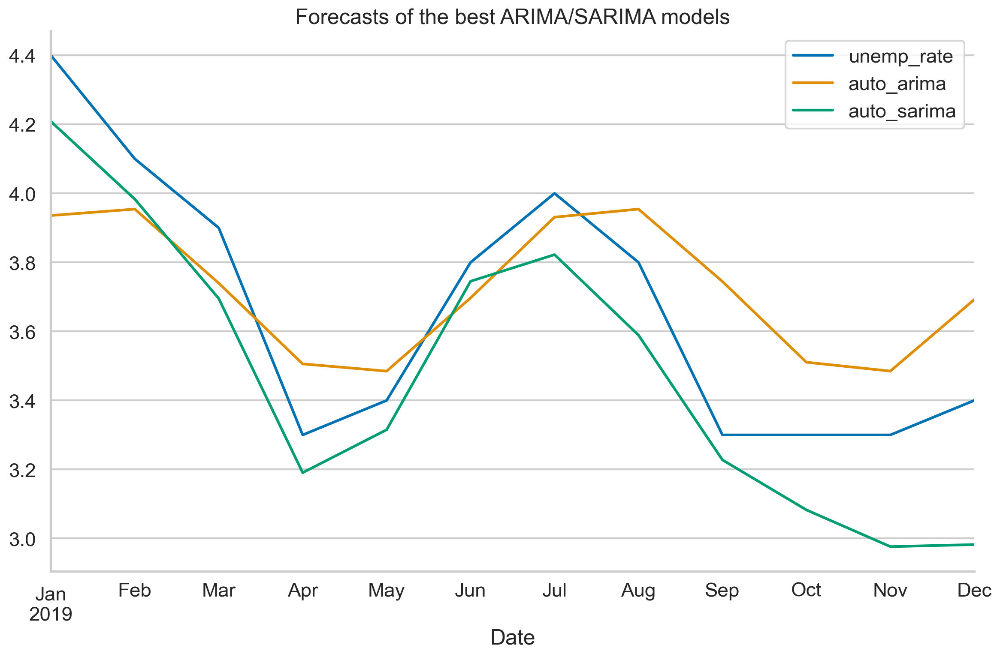

In [79]:
df_test["auto_arima"] = auto_arima.predict(TEST_LENGTH)
df_test["auto_sarima"] = auto_sarima.predict(TEST_LENGTH)
df_test.plot(title="Forecasts of the best ARIMA/SARIMA models");

sns.despine()
plt.tight_layout()
# plt.savefig("images/figure_6_30", dpi=200)

In [80]:
mape_auto_arima = mean_absolute_percentage_error(
    df_test["unemp_rate"], 
    df_test["auto_arima"]
)

mape_auto_sarima = mean_absolute_percentage_error(
    df_test["unemp_rate"], 
    df_test["auto_sarima"]
)

print(f"MAPE of auto-ARIMA: {100*mape_auto_arima:.2f}%")
print(f"MAPE of auto-SARIMA: {100*mape_auto_sarima:.2f}%")

MAPE of auto-ARIMA: 5.79%
MAPE of auto-SARIMA: 5.05%


### There's more

1. Import the libraries:

In [81]:
from pmdarima.pipeline import Pipeline
from pmdarima.preprocessing import FourierFeaturizer
from pmdarima.preprocessing import LogEndogTransformer
from pmdarima import arima

2. Create new features (month dummies) and split them into the train/test sets:

In [82]:
month_dummies = pd.get_dummies(
    df.index.month, 
    prefix="month_", 
    drop_first=True
)
month_dummies.index = df.index
df = df.join(month_dummies)

df_train = df.iloc[:-TEST_LENGTH]
df_test = df.iloc[-TEST_LENGTH:]

3. Find the best hyperparameters of the ARIMAX model:

In [83]:
auto_arimax = pm.auto_arima(
    df_train[["unemp_rate"]],
    exogenous=df_train.drop(columns=["unemp_rate"]),
    test="adf",
    seasonal=False,
    with_intercept=False,
    stepwise=True,
    suppress_warnings=True,
    trace=True
)
                            
auto_arimax.summary()

Performing stepwise search to minimize aic
 ARIMA(2,1,2)(0,0,0)[0]             : AIC=7.411, Time=0.20 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=77.864, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=77.461, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=75.688, Time=0.02 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=68.551, Time=0.07 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=54.321, Time=0.17 sec
 ARIMA(3,1,2)(0,0,0)[0]             : AIC=7.458, Time=0.27 sec
 ARIMA(2,1,3)(0,0,0)[0]             : AIC=7.155, Time=0.27 sec
 ARIMA(1,1,3)(0,0,0)[0]             : AIC=60.069, Time=0.09 sec
 ARIMA(3,1,3)(0,0,0)[0]             : AIC=10.692, Time=0.37 sec
 ARIMA(2,1,4)(0,0,0)[0]             : AIC=inf, Time=0.28 sec
 ARIMA(1,1,4)(0,0,0)[0]             : AIC=inf, Time=0.29 sec
 ARIMA(3,1,4)(0,0,0)[0]             : AIC=inf, Time=0.35 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=25.922, Time=0.27 sec

Best model:  ARIMA(2,1,3)(0,0,0)[0]          
Total fit time: 2.681 seco

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                      y   No. Observations:                  108
Model:               SARIMAX(2, 1, 3)   Log Likelihood                   2.423
Date:                Fri, 02 Feb 2024   AIC                              7.155
Time:                        09:34:58   BIC                             23.192
Sample:                    01-01-2010   HQIC                            13.656
                         - 12-01-2018                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          1.0040      0.008    132.649      0.000       0.989       1.019
ar.L2         -0.9970      0.004   -238.120      0.000      -1.005      -0.989
ma.L1         -1.2878      0.112    -11.531      0.000      -1.507      -1.069
ma.L2          1.2120      0.164      7.371      0.000       0.890       1.534
ma.L3         -0.2145      0.102     -2.097      0.036      -0.415      -0.014
sigma2         0.0526      0.010      5.389      0.000       0.033       0.072
===================================================================================
Ljung-Box (L1) (Q):                   2.80   Jarque-Bera (JB):                 1.43
Prob(Q):                              0.09   Prob(JB):                         0.49
Heteroskedasticity (H):               0.48   Skew:                             0.27
Prob(H) (two-sided):                  0.03   Kurtosis:                         3.13
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

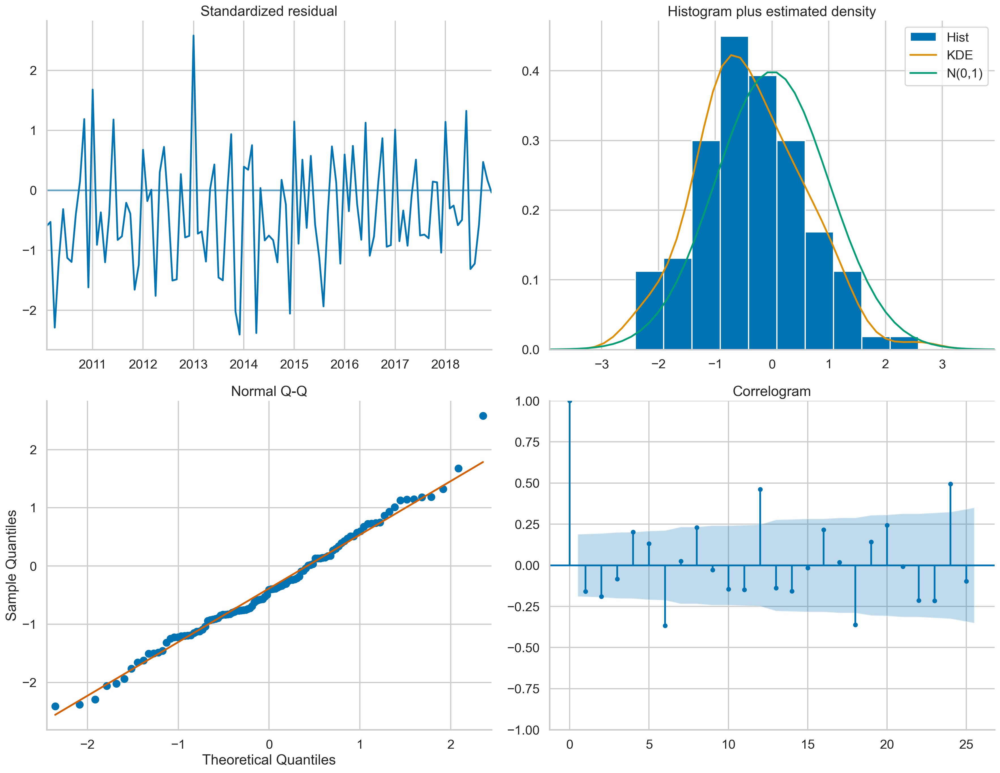

In [84]:
auto_arimax.plot_diagnostics(figsize=(18, 14), lags=25);

sns.despine()
plt.tight_layout()
# plt.savefig("images/figure_6_32", dpi=200)

4. Find the best hyperparameters of the ARIMA pipeline:

In [85]:
auto_arima_pipe = Pipeline([
    ("log_transform", LogEndogTransformer()),
    ("fourier", FourierFeaturizer(m=12)),
    ("arima", arima.AutoARIMA(stepwise=True, trace=1, 
                              error_action="warn",
                              test="adf", seasonal=False, 
                              with_intercept=False, 
                              suppress_warnings=True))
])

auto_arima_pipe.fit(df_train[["unemp_rate"]])

Performing stepwise search to minimize aic
 ARIMA(2,1,2)(0,0,0)[0]             : AIC=-443.949, Time=0.43 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=-451.806, Time=0.25 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=-449.936, Time=0.13 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=-449.932, Time=0.11 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=-447.934, Time=0.40 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=-462.898, Time=0.22 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=-464.399, Time=0.19 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=-465.503, Time=0.16 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=-475.671, Time=0.31 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=-483.865, Time=0.68 sec
 ARIMA(5,1,0)(0,0,0)[0] intercept   : AIC=-482.065, Time=0.64 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=-481.426, Time=0.79 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=-478.964, Time=0.68 sec
 ARIMA(5,1,1)(0,0,0)[0] intercept   : AIC=-480.438, Time=0.75 sec
 ARIMA(4,1,0)(0,0,0)[0]          

Pipeline(steps=[('log_transform', LogEndogTransformer()),
                ('fourier', FourierFeaturizer(m=12)),
                ('arima',
                 AutoARIMA(error_action='warn', seasonal=False, test='adf',
                           trace=1, with_intercept=False))])

5. Calculate the forecasts and plot them:

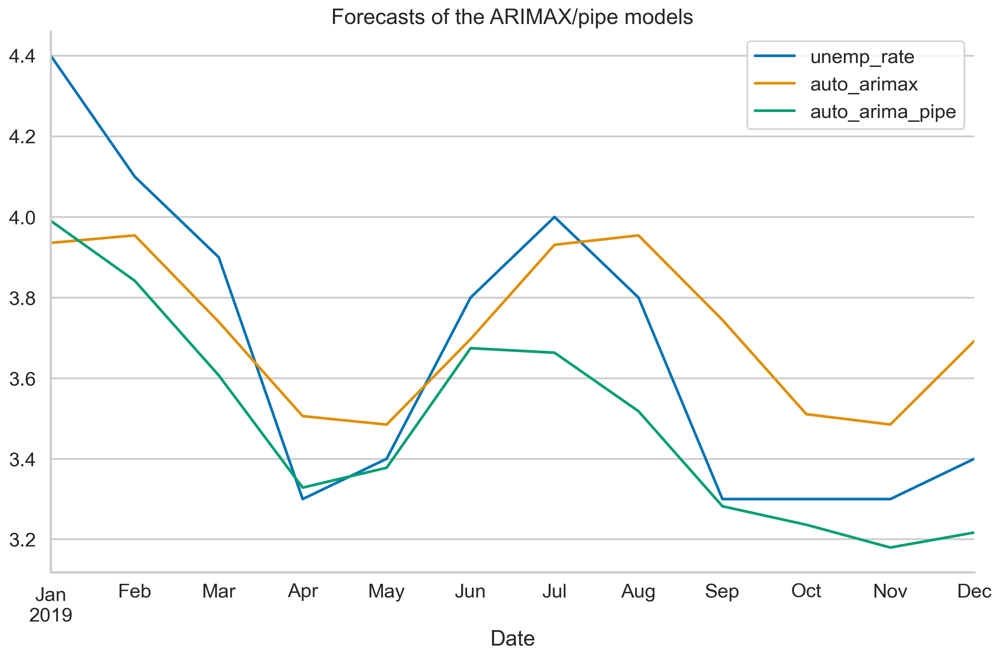

In [86]:
# specify return_conf_int when calling `predict` to get the confidence intervals
results_df = df_test[["unemp_rate"]].copy()
results_df["auto_arimax"] = auto_arimax.predict(
    TEST_LENGTH, 
    X=df_test.drop(columns=["unemp_rate"])
)
results_df["auto_arima_pipe"] = auto_arima_pipe.predict(TEST_LENGTH)
results_df.plot(title="Forecasts of the ARIMAX/pipe models");

sns.despine()
plt.tight_layout()
# plt.savefig("images/figure_6_33", dpi=200)

7. Calculate the MAPEs:

In [87]:
mape_auto_arimax = mean_absolute_percentage_error(results_df["unemp_rate"], 
                                                  results_df["auto_arimax"])

mape_auto_pipe = mean_absolute_percentage_error(results_df["unemp_rate"], 
                                                results_df["auto_arima_pipe"])

print(f"MAPE of auto-ARIMAX: {100*mape_auto_arimax:.2f}%")
print(f"MAPE of auto-pipe: {100*mape_auto_pipe:.2f}%")

MAPE of auto-ARIMAX: 5.79%
MAPE of auto-pipe: 4.61%
